# Capstone Project - The Battle of Neighborhoods

In [15]:
## Fr3nk for IBM Coursera Capstone Project

# 1. Project Summary:  
Using data science techniques to analyze the following questions:  
- What is best location in Brooklyn for Italian Restaurant ?
- Which areas have potential Italian Resturant Market ?
- Which all areas lack Italian Resturants ?
- Which areas are saturated with Italian restaurants? 

The data will be:
- New York city's neighborhoods. ([NY_dataset](https://cocl.us/new_york_dataset))
- Venues surrounding each neighborhoods. ([FourSquare API](https://developer.foursquare.com/))  

Target audiences will be:
- The objective is to locate and recommend to the management which neighborhood of New York City will be best choice to start an Italian Restaurant.  
- This would interest anyone who wants to start a new activity in a great city as NY.  

# 2. Data:
## 2.1. Get the NYC neighborhoods coordinate:  
URL: https://cocl.us/new_york_dataset

In [20]:
import pandas as pd
import requests
from bs4 import BeautifulSoup

import numpy as np # library to handle data in a vectorized manner

pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)

#!conda install -c conda-forge geopy --yes
from geopy.geocoders import Nominatim # convert an address into latitude and longitude values

# Matplotlib and associated plotting modules
import matplotlib.cm as cm
import matplotlib.colors as colors
import matplotlib.pyplot as plt

# import k-means from clustering stage
from sklearn.cluster import KMeans

#!conda install -c conda-forge folium=0.5.0 --yes
#=0.5.0 --yes # uncomment this line if you haven't completed the Foursquare API lab
import folium # map rendering library

print('Libraries imported.')

Libraries imported.


#### Define a function to get the geocodes: latitude and longitude of a given location using geopy.

In [21]:
def geo_location(address):
    # get geo location of address
    geolocator = Nominatim(user_agent="ny_explorer")
    location = geolocator.geocode(address)
    latitude = location.latitude
    longitude = location.longitude
    return latitude,longitude

#### Define a function to get venue details for a given venue id. This will be used for ranking.

In [23]:
def get_venues(lat,lng):
    
    #set variables
    radius=1000
    LIMIT=100
    VERSION = '20180605' # Foursquare API version
    
    #url to fetch data from foursquare api
    url = 'https://api.foursquare.com/v2/venues/explore?&client_id={}&client_secret={}&v={}&ll={},{}&radius={}&limit={}'.format(
            CLIENT_ID, 
            CLIENT_SECRET, 
            VERSION, 
            lat, 
            lng, 
            radius, 
            LIMIT)
    
    # get all the data
    results = requests.get(url).json()
    venue_data=results["response"]['groups'][0]['items']
    venue_details=[]
    for row in venue_data:
        try:
            venue_id=row['venue']['id']
            venue_name=row['venue']['name']
            venue_category=row['venue']['categories'][0]['name']
            venue_details.append([venue_id,venue_name,venue_category])
        except KeyError:
            pass
        
    column_names=['ID','Name','Category']
    df = pd.DataFrame(venue_details,columns=column_names)
    return df

#### Define a function to get the New York City data such as Boroughs, Neighborhoods along with their latitude and longitude.

In [24]:
def get_new_york_data():
    url='https://cocl.us/new_york_dataset'
    resp=requests.get(url).json()
    # all data is present in features label
    features=resp['features']
    
    # define the dataframe columns
    column_names = ['Borough', 'Neighborhood', 'Latitude', 'Longitude'] 
    # instantiate the dataframe
    new_york_data = pd.DataFrame(columns=column_names)
    
    for data in features:
        borough = data['properties']['borough'] 
        neighborhood_name = data['properties']['name']
        
        neighborhood_latlon = data['geometry']['coordinates']
        neighborhood_lat = neighborhood_latlon[1]
        neighborhood_lon = neighborhood_latlon[0]
    
        new_york_data = new_york_data.append({'Borough': borough,
                                          'Neighborhood': neighborhood_name,
                                          'Latitude': neighborhood_lat,
                                          'Longitude': neighborhood_lon}, ignore_index=True)
    
    return new_york_data

We will call the above funtion to get the new york city data.

In [46]:
# get new york data and create a DataFrame
new_york_data=get_new_york_data()
df = pd.DataFrame(new_york_data)
df.head()

,Borough,Neighborhood,Latitude,Longitude
0,Bronx,Wakefield,40.894705,-73.847201
1,Bronx,Co-op City,40.874294,-73.829939
2,Bronx,Eastchester,40.887556,-73.827806
3,Bronx,Fieldston,40.895437,-73.905643
4,Bronx,Riverdale,40.890834,-73.912585


In [48]:
df.shape

(306, 4)

There are a total of 306 different Neighborhoods (rows) in New York

In [482]:
df[df['Borough']=='Brooklyn'].count()

Borough         70
Neighborhood    70
Latitude        70
Longitude       70
dtype: int64

# 3. Methodology

## 3.1 Data Exploration

#### Plot the total number of Neighborhood for each Borough in New York City

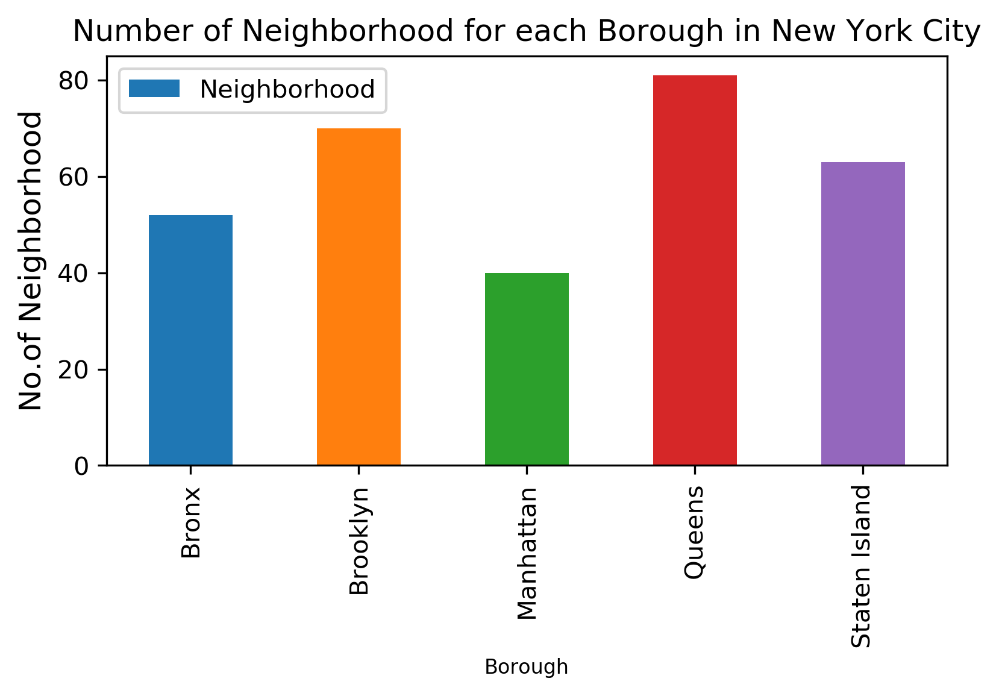

In [37]:
plt.figure(figsize=(6,3), dpi = 300)
# title
plt.title('Number of Neighborhood for each Borough in New York City')
#On x-axis
plt.xlabel('Borough', fontsize = 8)
#On y-axis
plt.ylabel('No.of Neighborhood', fontsize=12)
#giving a bar plot
new_york_data.groupby('Borough')['Neighborhood'].count().plot(kind='bar')
#legend
plt.legend()
#displays the plot
plt.show()

Queens has highest number of neighborhoods, followed by Brooklyn and Staten Island

#### Collect specific category (in this case Italian Restaurant) for each Neighborhood

In [134]:
limit = 500 # limit of number of venues returned by Foursquare API
radius = 5000 # define radius
#CLIENT_ID = 'ZAWBNTCLOZ5Y0WUFIPB22TR3KTQTC0QZ0LLUTVGKABAI1FYG'
#CLIENT_SECRET = 'GJGR5VU45VNMGYN30RLOMG0XGFW0PVYT2D2BJ1BU5QCYZSIZ'
CLIENT_ID = 'ZMHWBS0SR12Z3YDYVHJVTZPRK3U1ZP3I2TYQAJ5CU3JUHMB5'
CLIENT_SECRET = 'H3TT0XT3P5TIAFCV1Y2UUVLF42N44DICNKLUELK34H2TKLFR'
#CLIENT_ID ='UFLNZHIGCVD0KF4K4TYHZ2JBRSWVFWU2YYY03B5WQI02NFDD'
#CLIENT_SECRET = '4XYJKTRWKNGLBNZU2IMMGESEWT3YEROVIKAEENTW40VLLQJZ'
VERSION = '20181020'

In [30]:
# prepare neighborhood list that contains italian restaurants
column_names=['Borough', 'Neighborhood', 'ID','Name']
italian_rest_ny=pd.DataFrame(columns=column_names)
count=1
for row in new_york_data.values.tolist():
    Borough, Neighborhood, Latitude, Longitude=row
    venues = get_venues(Latitude,Longitude)
    italian_resturants=venues[venues['Category']=='Italian Restaurant']   
    print('(',count,'/',len(new_york_data),')','Italian Resturants in '+Neighborhood+', '+Borough+':'+str(len(italian_resturants)))
    for resturant_detail in italian_resturants.values.tolist():
        id, name , category=resturant_detail
        italian_rest_ny = italian_rest_ny.append({'Borough': Borough,
                                                'Neighborhood': Neighborhood, 
                                                'ID': id,
                                                'Name' : name
                                               }, ignore_index=True)
    count+=1

( 1 / 306 ) Italian Resturants in Wakefield, Bronx:0
( 2 / 306 ) Italian Resturants in Co-op City, Bronx:0
( 3 / 306 ) Italian Resturants in Eastchester, Bronx:0
( 4 / 306 ) Italian Resturants in Fieldston, Bronx:0
( 5 / 306 ) Italian Resturants in Riverdale, Bronx:1
( 6 / 306 ) Italian Resturants in Kingsbridge, Bronx:1
( 7 / 306 ) Italian Resturants in Marble Hill, Manhattan:0
( 8 / 306 ) Italian Resturants in Woodlawn, Bronx:2
( 9 / 306 ) Italian Resturants in Norwood, Bronx:0
( 10 / 306 ) Italian Resturants in Williamsbridge, Bronx:0
( 11 / 306 ) Italian Resturants in Baychester, Bronx:2
( 12 / 306 ) Italian Resturants in Pelham Parkway, Bronx:3
( 13 / 306 ) Italian Resturants in City Island, Bronx:3
( 14 / 306 ) Italian Resturants in Bedford Park, Bronx:0
( 15 / 306 ) Italian Resturants in University Heights, Bronx:0
( 16 / 306 ) Italian Resturants in Morris Heights, Bronx:0
( 17 / 306 ) Italian Resturants in Fordham, Bronx:8
( 18 / 306 ) Italian Resturants in East Tremont, Bronx:

( 141 / 306 ) Italian Resturants in Sunnyside, Queens:2
( 142 / 306 ) Italian Resturants in East Elmhurst, Queens:1
( 143 / 306 ) Italian Resturants in Maspeth, Queens:1
( 144 / 306 ) Italian Resturants in Ridgewood, Queens:3
( 145 / 306 ) Italian Resturants in Glendale, Queens:1
( 146 / 306 ) Italian Resturants in Rego Park, Queens:1
( 147 / 306 ) Italian Resturants in Woodhaven, Queens:0
( 148 / 306 ) Italian Resturants in Ozone Park, Queens:1
( 149 / 306 ) Italian Resturants in South Ozone Park, Queens:1
( 150 / 306 ) Italian Resturants in College Point, Queens:2
( 151 / 306 ) Italian Resturants in Whitestone, Queens:5
( 152 / 306 ) Italian Resturants in Bayside, Queens:3
( 153 / 306 ) Italian Resturants in Auburndale, Queens:1
( 154 / 306 ) Italian Resturants in Little Neck, Queens:6
( 155 / 306 ) Italian Resturants in Douglaston, Queens:5
( 156 / 306 ) Italian Resturants in Glen Oaks, Queens:1
( 157 / 306 ) Italian Resturants in Bellerose, Queens:2
( 158 / 306 ) Italian Resturants

( 276 / 306 ) Italian Resturants in Stuyvesant Town, Manhattan:3
( 277 / 306 ) Italian Resturants in Flatiron, Manhattan:2
( 278 / 306 ) Italian Resturants in Sunnyside Gardens, Queens:2
( 279 / 306 ) Italian Resturants in Blissville, Queens:0
( 280 / 306 ) Italian Resturants in Fulton Ferry, Brooklyn:2
( 281 / 306 ) Italian Resturants in Vinegar Hill, Brooklyn:2
( 282 / 306 ) Italian Resturants in Weeksville, Brooklyn:0
( 283 / 306 ) Italian Resturants in Broadway Junction, Brooklyn:0
( 284 / 306 ) Italian Resturants in Dumbo, Brooklyn:2
( 285 / 306 ) Italian Resturants in Manor Heights, Staten Island:0
( 286 / 306 ) Italian Resturants in Willowbrook, Staten Island:1
( 287 / 306 ) Italian Resturants in Sandy Ground, Staten Island:0
( 288 / 306 ) Italian Resturants in Egbertville, Staten Island:1
( 289 / 306 ) Italian Resturants in Roxbury, Queens:0
( 290 / 306 ) Italian Resturants in Homecrest, Brooklyn:1
( 291 / 306 ) Italian Resturants in Middle Village, Queens:1
( 292 / 306 ) Itali

Print the list of neighborhoods that contains italian restaurants

In [31]:
italian_rest_ny.head()

,Borough,Neighborhood,ID,Name
0,Bronx,Riverdale,55aaee4d498e3cbb70e625d6,Bella Notte Pizzeria
1,Bronx,Kingsbridge,55aaee4d498e3cbb70e625d6,Bella Notte Pizzeria
2,Bronx,Woodlawn,511edb6de4b0d58346fd272d,Patrizia's Of Woodlawn
3,Bronx,Woodlawn,4d3cb3026b3d236a066a6364,Rivers Edge
4,Bronx,Baychester,4c9518076b35a143d5dc21dc,Fratelli's


In [32]:
italian_rest_ny.shape

(539, 4)

The are 539 Italian Resturants across Neighborhoods in New York City

In [69]:
#We got data for all resturants. Now lets save this data to a csv sheet.
italian_rest_ny.to_csv('italian_rest_ny.csv', index=False)
italian_rest_ny_csv=pd.read_csv('italian_rest_ny.csv')
italian_rest_ny.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 539 entries, 0 to 538
Data columns (total 4 columns):
Borough         539 non-null object
Neighborhood    539 non-null object
ID              539 non-null object
Name            539 non-null object
dtypes: object(4)
memory usage: 16.9+ KB


#### Plot results

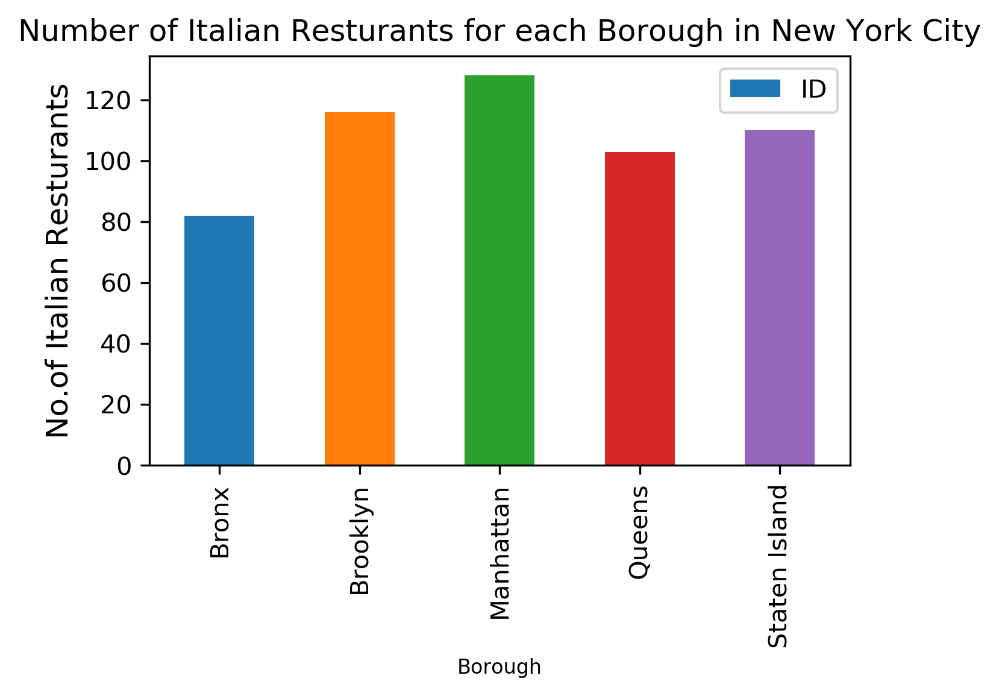

In [36]:
plt.figure(figsize=(5,3), dpi = 300)
# title
plt.title('Number of Italian Resturants for each Borough in New York City')
#On x-axis
plt.xlabel('Borough', fontsize = 8)
#On y-axis
plt.ylabel('No.of Italian Resturants', fontsize=12)
#giving a bar plot
italian_rest_ny.groupby('Borough')['ID'].count().plot(kind='bar')
#legend
plt.legend()
#displays the plot
plt.show()

Manhattan has the largest number of italian resturants, followed by Brooklyn. Bronx has the smallest number of italian resturants.

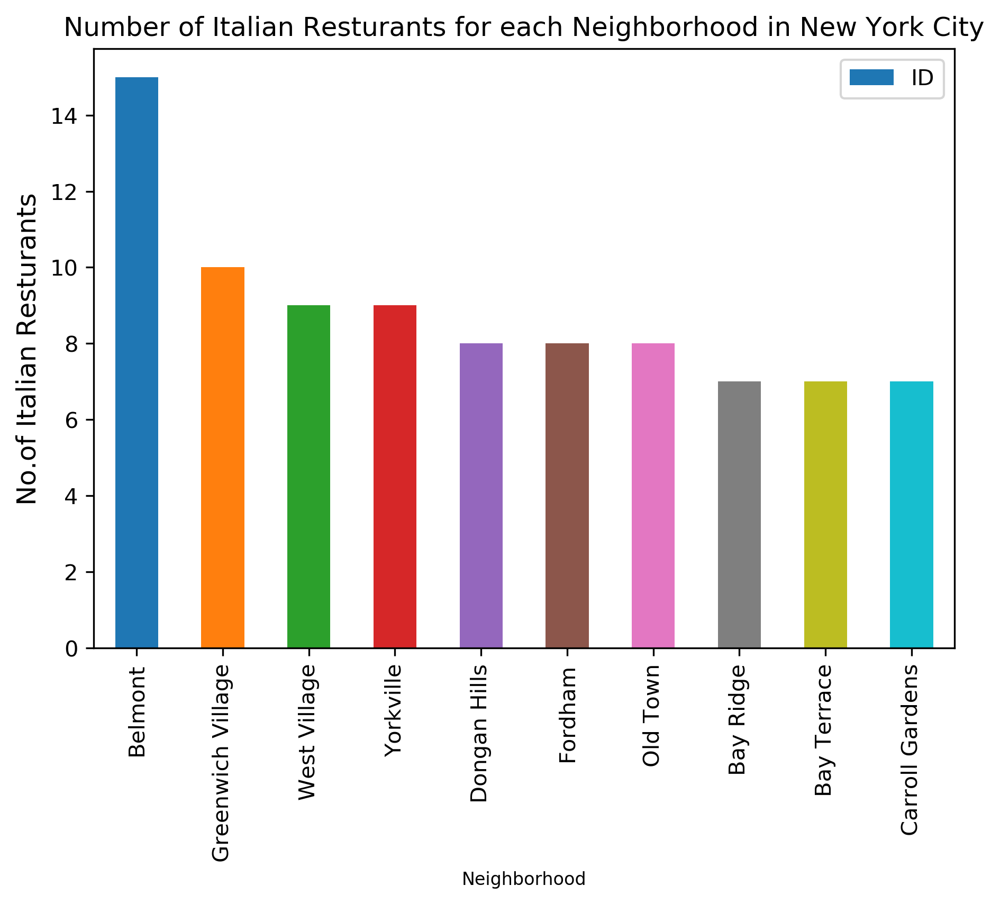

In [38]:
plt.figure(figsize=(7,5), dpi = 300)
# title
plt.title('Number of Italian Resturants for each Neighborhood in New York City')
#On x-axis
plt.xlabel('Neighborhood', fontsize = 8)
#On y-axis
plt.ylabel('No.of Italian Resturants', fontsize=12)
#giving a bar plot
italian_rest_ny.groupby('Neighborhood')['ID'].count().nlargest(10).plot(kind='bar')
#legend
plt.legend()
#displays the plot
plt.show()

In [41]:
#Filter and print results of the Neighborood with max number of italian restaurant

In [42]:
italian_rest_ny[italian_rest_ny['Neighborhood']=='Belmont']

,Borough,Neighborhood,ID,Name
41,Bronx,Belmont,4acf80aef964a52025d420e3,Tino's Delicatessen
42,Bronx,Belmont,4af71916f964a520cf0522e3,Michaelangelo's Coal Fired Brick Oven Pizza Re...
43,Bronx,Belmont,4bb6470cef159c7465b275f7,Calabria Pork Store
44,Bronx,Belmont,4af0fa29f964a52060e021e3,Antonio's Trattoria
45,Bronx,Belmont,4aa425bef964a5208e4520e3,Dominick's Restaurant
46,Bronx,Belmont,4b5514c4f964a5207cda27e3,Enzo's
47,Bronx,Belmont,4a8e261cf964a5201c1220e3,Roberto
48,Bronx,Belmont,4aa193d5f964a520124120e3,Mario's Restaurant & Catering
49,Bronx,Belmont,4c79d294278eb713f6a05580,Cafe al Mercato
50,Bronx,Belmont,4b5a4c8ff964a52049bb28e3,Emilia's Restaurant


Belmont (even located in Bronx which has the lowest number of italian restaurant) has highest number of Italian Resturants with a total count of 15.
Belmont is a primarily residential neighborhood geographically located in the Bronx in New York City. 

#### Filter and print results of the count of italian restaurant in Brooklyn

In [43]:
italian_rest_ny[italian_rest_ny['Borough']=='Brooklyn']

,Borough,Neighborhood,ID,Name
74,Brooklyn,Bay Ridge,4adb7364f964a520a32721e3,Areo Ristorante
75,Brooklyn,Bay Ridge,4b70d8dff964a52063312de3,Tuscany Grill
76,Brooklyn,Bay Ridge,4a7e205ef964a52012f11fe3,Sofia Restorante Italiano
77,Brooklyn,Bay Ridge,4bd075f2caff952145d3cef0,Gino's Restaurant
78,Brooklyn,Bay Ridge,3fd66200f964a5205fee1ee3,Ponte Vecchio Restaurant
79,Brooklyn,Bay Ridge,4e732dff45dd41e9ccce1987,Giacomo's Wood Fired Pizza & Trattoria
80,Brooklyn,Bay Ridge,4ad62c95f964a5208d0521e3,Zio Toto
81,Brooklyn,Bensonhurst,4ae23a80f964a5200c8c21e3,il Colosseo
82,Brooklyn,Bensonhurst,4e073239cc3f1ed1312dce37,Panino Rustico
83,Brooklyn,Bensonhurst,4c0791492e80a593eabf75f9,Papa Pasquale


In [44]:
italian_rest_ny[italian_rest_ny['Borough']=='Brooklyn'].count()

Borough         116
Neighborhood    116
ID              116
Name            116
dtype: int64

The are 116 Italian Resturants across Brooklyn (21% of New York City)

#### Plot the map of New York City with the Neighborhoods superimposed on it

Get geographical coordinates of New York with geocoders

In [50]:
address = 'New York, US'
geolocator = Nominatim(user_agent="capstoneProject")
location = geolocator.geocode(address, timeout=60, exactly_one=True)
latitude = location.latitude
longitude = location.longitude
print('The geographical coordinates of New York are {}, {}.'.format(latitude, longitude))

The geographical coordinates of New York are 40.7127281, -74.0060152.


In [51]:
# Make a copy of the dataframe to get it simply back if needed
df3 = df.copy()
df3.head()

,Borough,Neighborhood,Latitude,Longitude
0,Bronx,Wakefield,40.894705,-73.847201
1,Bronx,Co-op City,40.874294,-73.829939
2,Bronx,Eastchester,40.887556,-73.827806
3,Bronx,Fieldston,40.895437,-73.905643
4,Bronx,Riverdale,40.890834,-73.912585


In [62]:
# Create map of New York using latitude and longitude values
map_ny = folium.Map(location=[latitude, longitude], zoom_start=12, tiles='cartodbpositron')

# add markers to map
for lat, lng, local in zip(df3['Latitude'], df3['Longitude'], df3['Neighborhood']):
    label = '{}'.format(local)
    label = folium.Popup(label, parse_html=True)
    folium.CircleMarker(
        [lat, lng],
        radius=5,
        popup=label,
        color='blue',
        fill=True,
        fill_color='blue',
        fill_opacity=0.7).add_to(map_ny)  
    
map_ny

#### Create a DataFrame with Borough of interest: Brooklyn

In [63]:
df_broo = df3[df3['Borough'] == 'Brooklyn']
print(df_broo.shape)
df_broo.head()

(70, 4)


,Borough,Neighborhood,Latitude,Longitude
46,Brooklyn,Bay Ridge,40.625801,-74.030621
47,Brooklyn,Bensonhurst,40.611009,-73.995180
48,Brooklyn,Sunset Park,40.645103,-74.010316
49,Brooklyn,Greenpoint,40.730201,-73.954241
50,Brooklyn,Gravesend,40.595260,-73.973471


Create map of Brooklyn using latitude and longitude values

In [64]:
map_broo = folium.Map(location=[latitude, longitude], zoom_start=11)

#add markers to map
for lat, lng, local in zip(df_broo['Latitude'], df_broo['Longitude'], df_broo['Neighborhood']):
    label = '{}'.format(local)
    label = folium.Popup(label, parse_html=True)
    folium.CircleMarker(
        [lat, lng],
        radius=10,
        popup=label,
        color='blue',
        fill=True,
        fill_color='#3186cc',
        fill_opacity=0.7).add_to(map_broo)
map_broo

#### Due to the aim of the project and the request of the stockholder, we taking into account Italian restaurants of a specific area (Brooklyn) 

In [71]:
radius = 500
LIMIT = 100
query='Italian restaurant'

venues = []

for lat, long, borough in zip(df_broo['Latitude'], df_broo['Longitude'],df_broo['Neighborhood'] ):
    url = "https://api.foursquare.com/v2/venues/explore?client_id={}&client_secret={}&v={}&ll={},{}&radius={}&limit={}&query={}".format(
        CLIENT_ID,
        CLIENT_SECRET,
        VERSION,
        lat,
        long,
        radius, 
        LIMIT,
        query)
    
    results = requests.get(url).json()["response"]['groups'][0]['items']
    
    for venue in results:
        venues.append((
            borough,
            lat, 
            long, 
            venue['venue']['name'], 
            venue['venue']['location']['lat'], 
            venue['venue']['location']['lng'],  
            venue['venue']['categories'][0]['name']))

Create and save dataframe of italian restaurant in Brooklyn

In [158]:
venues_df = pd.DataFrame(venues)
venues_df.columns = ['Neighborhood', 'NeighborhoodLatitude', 'NeighborhoodLongitude', 'VenueName', 'VenueLatitude', 'VenueLongitude', 'VenueCategory']
print(venues_df.shape)
venues_df.head()

(544, 7)


,Neighborhood,NeighborhoodLatitude,NeighborhoodLongitude,VenueName,VenueLatitude,VenueLongitude,VenueCategory
0,Bay Ridge,40.625801,-74.030621,Tuscany Grill,40.622913,-74.031387,Italian Restaurant
1,Bay Ridge,40.625801,-74.030621,Areo Ristorante,40.624415,-74.030782,Italian Restaurant
2,Bay Ridge,40.625801,-74.030621,Gino's Restaurant,40.629859,-74.022543,Italian Restaurant
3,Bay Ridge,40.625801,-74.030621,Greenhouse Cafe,40.629542,-74.028514,Italian Restaurant
4,Bay Ridge,40.625801,-74.030621,Sofia Restorante Italiano,40.624847,-74.030522,Italian Restaurant


In [159]:
broo_venues_rest=pd.DataFrame(venues_df)
broo_venues_rest.to_csv('broo_venues_rest.csv', index=False)

In [160]:
broo_venues_rest=pd.read_csv('broo_venues_rest.csv')
broo_venues_rest.info()
broo_venues_rest.shape

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 544 entries, 0 to 543
Data columns (total 7 columns):
Neighborhood             544 non-null object
NeighborhoodLatitude     544 non-null float64
NeighborhoodLongitude    544 non-null float64
VenueName                544 non-null object
VenueLatitude            544 non-null float64
VenueLongitude           544 non-null float64
VenueCategory            544 non-null object
dtypes: float64(4), object(3)
memory usage: 29.8+ KB


(544, 7)

#### Group by Borough and count uniques categories

In [76]:
broo_venues_rest.groupby('Borough').count()

,BoroughLatitude,BoroughLongitude,VenueName,VenueLatitude,VenueLongitude,VenueCategory
Borough,,,,,,
Bath Beach,5,5,5,5,5,5
Bay Ridge,17,17,17,17,17,17
Bedford Stuyvesant,3,3,3,3,3,3
Bensonhurst,12,12,12,12,12,12
Bergen Beach,2,2,2,2,2,2
Boerum Hill,37,37,37,37,37,37
Brighton Beach,2,2,2,2,2,2
Brooklyn Heights,22,22,22,22,22,22
Bushwick,7,7,7,7,7,7


In [77]:
print('There are {} uniques categories.'.format(len(broo_venues_rest['VenueCategory'].unique())))

There are 5 uniques categories.


In [78]:
se_venue_unique_count = broo_venues_rest['VenueCategory'].value_counts().to_frame(name='Count')

In [79]:
se_venue_unique_count.head(5)

,Count
Italian Restaurant,536
Bar,3
Gastropub,2
Food & Drink Shop,2
Pizza Place,1


#### There are a total of 536 Itlaian Restaurant in Brooklyn

In [483]:
# create map of Brooklyn Neighborhoods with italian restaurants superimposed on it
map_broo_rest = folium.Map(location=[latitude, longitude], zoom_start=11)

# add markers to map
for lat, lng, local in zip(df_broo['Latitude'], df_broo['Longitude'], df_broo['Neighborhood']):
    label = '{}'.format(local)
    label = folium.Popup(label, parse_html=True)
    folium.CircleMarker(
        [lat, lng],
        radius=5,
        popup=label,
        color='blue',
        fill=True,
        fill_color='blue',
        fill_opacity=0.3).add_to(map_broo_rest)
for lat, lng, local in zip(broo_venues_rest['VenueLatitude'], broo_venues_rest['VenueLongitude'], broo_venues_rest['VenueName']):
    label = '{}'.format(local)
    label = folium.Popup(label, parse_html=True)
    folium.CircleMarker(
        [lat, lng],
        radius=5,
        popup=label,
        color='red',
        fill=True,
        fill_color='red',
        fill_opacity=0.3).add_to(map_broo_rest)
    
map_broo_rest

The following (and obviously other) categories could be important in determining places with a high flow of people and therefore potential customers for our Italian Restaurant.
Further, we will utilize these categories for assigning a weighted score to the potential Neighborhoods
 - High School categoryId='4bf58dd8d48988d13d941735'
 - University categoryId='4bf58dd8d48988d1ae941735'
 - Office categoryId='4d4b7105d754a06375d81259'
 
Other valuable categories could be:
 - 'Food'= '4d4b7105d754a06374d81259',
 - 'Shop & Service'= '4d4b7105d754a06378d81259',
 - 'Bus Stop'= '52f2ab2ebcbc57f1066b8b4f',
 - 'Metro Station'= '4bf58dd8d48988d1fd931735',
 - 'Nightlife Spot' = '4d4b7105d754a06376d81259',
 - 'Arts & Entertainment'= '4d4b7104d754a06370d81259'
 - 'Park' ecc..

In [85]:
#High School
radius = 500
LIMIT = 100
categoryId='4bf58dd8d48988d13d941735'

venues_school = []

for lat, long, borough in zip(df_broo['Latitude'], df_broo['Longitude'],df_broo['Neighborhood'] ):
    url = "https://api.foursquare.com/v2/venues/explore?client_id={}&client_secret={}&v={}&ll={},{}&radius={}&limit={}&categoryId={}".format(
        CLIENT_ID,
        CLIENT_SECRET,
        VERSION,
        lat,
        long,
        radius, 
        LIMIT,
        categoryId)
    
    results = requests.get(url).json()["response"]['groups'][0]['items']
    
    for venue in results:
        venues_school.append((
            borough,
            lat, 
            long, 
            venue['venue']['name'], 
            venue['venue']['location']['lat'], 
            venue['venue']['location']['lng'],  
            venue['venue']['categories'][0]['name']))

In [161]:
broo_venues_highschools = pd.DataFrame(venues_school)
broo_venues_highschools.columns = ['Neighborhood', 'NeighborhoodLatitude', 'NeighborhoodLongitude', 'VenueName', 'VenueLatitude', 'VenueLongitude', 'VenueCategory']
broo_venues_highschools.to_csv('broo_venues_highschools.csv', index=False)

In [162]:
broo_venues_highschools=pd.read_csv('broo_venues_highschools.csv')
broo_venues_highschools.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 81 entries, 0 to 80
Data columns (total 7 columns):
Neighborhood             81 non-null object
NeighborhoodLatitude     81 non-null float64
NeighborhoodLongitude    81 non-null float64
VenueName                81 non-null object
VenueLatitude            81 non-null float64
VenueLongitude           81 non-null float64
VenueCategory            81 non-null object
dtypes: float64(4), object(3)
memory usage: 4.5+ KB


(81, 7)

In [488]:
broo_venues_highschools.head()

,Neighborhood,NeighborhoodLatitude,NeighborhoodLongitude,VenueName,VenueLatitude,VenueLongitude,VenueCategory
0,Manhattan Terrace,40.614433,-73.957438,Imagine Academy,40.613982,-73.961236,High School
1,Crown Heights,40.670829,-73.943291,St. Marks School,40.667342,-73.945092,High School
2,Windsor Terrace,40.656946,-73.980073,Bishop Ford Central Catholic High School,40.655988,-73.981990,High School
3,Prospect Heights,40.676822,-73.964859,Acorn Community High School,40.678797,-73.961601,High School
4,Brownsville,40.663950,-73.910235,Teachers Preparatory High School,40.665318,-73.911899,High School


In [489]:
broo_venues_highschools.shape

(81, 7)

#### There are 81 High School across Brooklyn

In [ ]:
map_broo_highschools = folium.Map(location=[latitude, longitude], zoom_start=12)
addToMap(broo_venues_highschools, 'green', map_broo_highschools)
map_broo_highschools

In [485]:
# create map of Brooklyn Neighborhoods with highschools and italian restaurants superimposed on it
map_broo_rest = folium.Map(location=[latitude, longitude], zoom_start=11)

# add markers to map
for lat, lng, local in zip(df_broo['Latitude'], df_broo['Longitude'], df_broo['Neighborhood']):
    label = '{}'.format(local)
    label = folium.Popup(label, parse_html=True)
    folium.CircleMarker(
        [lat, lng],
        radius=5,
        popup=label,
        color='blue',
        fill=True,
        fill_color='blue',
        fill_opacity=0.3).add_to(map_broo_rest)
for lat, lng, local in zip(broo_venues_rest['VenueLatitude'], broo_venues_rest['VenueLongitude'], broo_venues_rest['VenueName']):
    label = '{}'.format(local)
    label = folium.Popup(label, parse_html=True)
    folium.CircleMarker(
        [lat, lng],
        radius=5,
        popup=label,
        color='red',
        fill=True,
        fill_color='red',
        fill_opacity=0.3).add_to(map_broo_rest)
for lat, lng, local in zip(broo_venues_highschools['VenueLatitude'], broo_venues_highschools['VenueLongitude'], broo_venues_highschools['VenueName']):
    label = '{}'.format(local)
    label = folium.Popup(label, parse_html=True)
    folium.CircleMarker(
        [lat, lng],
        radius=5,
        popup=label,
        color='green',
        fill=True,
        fill_color='green',
        fill_opacity=0.3).add_to(map_broo_rest)
    
map_broo_rest

In [96]:
#University
radius = 500
LIMIT = 100
categoryId='4bf58dd8d48988d1ae941735'

venues_uni = []

for lat, long, borough in zip(df_broo['Latitude'], df_broo['Longitude'],df_broo['Neighborhood'] ):
    url = "https://api.foursquare.com/v2/venues/explore?client_id={}&client_secret={}&v={}&ll={},{}&radius={}&limit={}&categoryId={}".format(
        CLIENT_ID,
        CLIENT_SECRET,
        VERSION,
        lat,
        long,
        radius, 
        LIMIT,
        categoryId)
    
    results = requests.get(url).json()["response"]['groups'][0]['items']
    
    for venue in results:
        venues_uni.append((
            borough,
            lat, 
            long, 
            venue['venue']['name'], 
            venue['venue']['location']['lat'], 
            venue['venue']['location']['lng'],  
            venue['venue']['categories'][0]['name']))

In [163]:
broo_venues_uni = pd.DataFrame(venues_uni)
broo_venues_uni.columns = ['Neighborhood', 'NeighborhoodLatitude', 'NeighborhoodLongitude', 'VenueName', 'VenueLatitude', 'VenueLongitude', 'VenueCategory']
broo_venues_uni.to_csv('broo_venues_uni.csv', index=False)

In [164]:
broo_venues_uni=pd.read_csv('broo_venues_uni.csv')
broo_venues_uni.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 24 entries, 0 to 23
Data columns (total 7 columns):
Neighborhood             24 non-null object
NeighborhoodLatitude     24 non-null float64
NeighborhoodLongitude    24 non-null float64
VenueName                24 non-null object
VenueLatitude            24 non-null float64
VenueLongitude           24 non-null float64
VenueCategory            24 non-null object
dtypes: float64(4), object(3)
memory usage: 1.4+ KB


In [490]:
broo_venues_uni.head()

,Neighborhood,NeighborhoodLatitude,NeighborhoodLongitude,VenueName,VenueLatitude,VenueLongitude,VenueCategory
0,Bay Ridge,40.625801,-74.030621,Stepping Stones Nursery School,40.623738,-74.032234,University
1,Bensonhurst,40.611009,-73.995180,In search of Panacea,40.614163,-73.998972,University
2,Sheepshead Bay,40.586890,-73.943186,Financial Peace University,40.589802,-73.939568,University
3,Crown Heights,40.670829,-73.943291,Cornell University Cooperative Extensions-Broo...,40.667823,-73.945043,University
4,Prospect Heights,40.676822,-73.964859,Baccalaureate of Science,40.676875,-73.965053,University


In [491]:
broo_venues_uni.shape

(24, 7)

#### There are 24 Univesity across Brooklyn

In [495]:
# create map of Brooklyn Neighborhoods with Uni and italian restaurants superimposed on it
map_broo_rest = folium.Map(location=[latitude, longitude], zoom_start=11)

# add markers to map
for lat, lng, local in zip(df_broo['Latitude'], df_broo['Longitude'], df_broo['Neighborhood']):
    label = '{}'.format(local)
    label = folium.Popup(label, parse_html=True)
    folium.CircleMarker(
        [lat, lng],
        radius=5,
        popup=label,
        color='blue',
        fill=True,
        fill_color='#3186cc',
        fill_opacity=0.7).add_to(map_broo_rest)
for lat, lng, local in zip(broo_venues_rest['VenueLatitude'], broo_venues_rest['VenueLongitude'], broo_venues_rest['VenueName']):
    label = '{}'.format(local)
    label = folium.Popup(label, parse_html=True)
    folium.CircleMarker(
        [lat, lng],
        radius=5,
        popup=label,
        color='red',
        fill=True,
        fill_color='#3186cc',
        fill_opacity=0.7).add_to(map_broo_rest)
for lat, lng, local in zip(broo_venues_uni['VenueLatitude'], broo_venues_uni['VenueLongitude'], broo_venues_uni['VenueName']):
    label = '{}'.format(local)
    label = folium.Popup(label, parse_html=True)
    folium.CircleMarker(
        [lat, lng],
        radius=5,
        popup=label,
        color='green',
        fill=True,
        fill_color='#3186cc',
        fill_opacity=0.7).add_to(map_broo_rest)
    
map_broo_rest

In [137]:
#Office
radius = 500
LIMIT = 100
categoryId='4d4b7105d754a06375d81259'

venues_office = []

for lat, long, borough in zip(df_broo['Latitude'], df_broo['Longitude'],df_broo['Neighborhood'] ):
    url = "https://api.foursquare.com/v2/venues/explore?client_id={}&client_secret={}&v={}&ll={},{}&radius={}&limit={}&categoryId={}".format(
        CLIENT_ID,
        CLIENT_SECRET,
        VERSION,
        lat,
        long,
        radius, 
        LIMIT,
        categoryId)
    
    results = requests.get(url).json()["response"]['groups'][0]['items']
    
    for venue in results:
        venues_office.append((
            borough,
            lat, 
            long, 
            venue['venue']['name'], 
            venue['venue']['location']['lat'], 
            venue['venue']['location']['lng'],  
            venue['venue']['categories'][0]['name']))

In [166]:
broo_venues_office = pd.DataFrame(venues_office)
broo_venues_office.columns = ['Neighborhood', 'NeighborhoodLatitude', 'NeighborhoodLongitude', 'VenueName', 'VenueLatitude', 'VenueLongitude', 'VenueCategory']
broo_venues_office.to_csv('broo_venues_office.csv', index=False)

In [167]:
broo_venues_office=pd.read_csv('broo_venues_office.csv')
broo_venues_office.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3278 entries, 0 to 3277
Data columns (total 7 columns):
Neighborhood             3278 non-null object
NeighborhoodLatitude     3278 non-null float64
NeighborhoodLongitude    3278 non-null float64
VenueName                3278 non-null object
VenueLatitude            3278 non-null float64
VenueLongitude           3278 non-null float64
VenueCategory            3278 non-null object
dtypes: float64(4), object(3)
memory usage: 179.3+ KB


(3278, 7)

In [492]:
broo_venues_office.head()

,Neighborhood,NeighborhoodLatitude,NeighborhoodLongitude,VenueName,VenueLatitude,VenueLongitude,VenueCategory
0,Bay Ridge,40.625801,-74.030621,WishWash Carpet Cleaning & Restoration of Bay ...,40.626575,-74.029934,Home Service
1,Bay Ridge,40.625801,-74.030621,R&G Brenner Income Tax,40.623178,-74.027960,Financial or Legal Service
2,Bay Ridge,40.625801,-74.030621,Integrated Financial Services,40.627018,-74.029886,Office
3,Bay Ridge,40.625801,-74.030621,Polizzi Fine Art,40.625183,-74.029995,Building
4,Bay Ridge,40.625801,-74.030621,H And R Block,40.623158,-74.028259,Office


In [493]:
broo_venues_office.shape

(3278, 7)

There are 3278 offices across Brooklyn

In [496]:
# create map of Brooklyn Neighborhoods with offices and italian restaurants superimposed on it
map_broo_rest = folium.Map(location=[latitude, longitude], zoom_start=11)

# add markers to map
for lat, lng, local in zip(df_broo['Latitude'], df_broo['Longitude'], df_broo['Neighborhood']):
    label = '{}'.format(local)
    label = folium.Popup(label, parse_html=True)
    folium.CircleMarker(
        [lat, lng],
        radius=5,
        popup=label,
        color='blue',
        fill=True,
        fill_color='#3186cc',
        fill_opacity=0.7).add_to(map_broo_rest)
for lat, lng, local in zip(broo_venues_rest['VenueLatitude'], broo_venues_rest['VenueLongitude'], broo_venues_rest['VenueName']):
    label = '{}'.format(local)
    label = folium.Popup(label, parse_html=True)
    folium.CircleMarker(
        [lat, lng],
        radius=5,
        popup=label,
        color='red',
        fill=True,
        fill_color='#3186cc',
        fill_opacity=0.7).add_to(map_broo_rest)
for lat, lng, local in zip(broo_venues_office['VenueLatitude'], broo_venues_office['VenueLongitude'], broo_venues_office['VenueName']):
    label = '{}'.format(local)
    label = folium.Popup(label, parse_html=True)
    folium.CircleMarker(
        [lat, lng],
        radius=5,
        popup=label,
        color='gold',
        fill=True,
        fill_color='gold',
        fill_opacity=0.7).add_to(map_broo_rest)
    
map_broo_rest

## 3.2 Scoring matrix and results

Create a new data frame adding information on offices, high schools, and universities 

In [191]:
def addColumn(startDf, columnTitle, dataDf):
    grouped = dataDf.groupby('Neighborhood').count()
    
    for n in startDf['Neighborhood']:
        try:
            startDf.loc[startDf['Neighborhood'] == n,columnTitle] = grouped.loc[n, 'VenueName']
        except:
            startDf.loc[startDf['Neighborhood'] == n,columnTitle] = 0

In [192]:
df3.copy()

,Borough,Neighborhood,Latitude,Longitude
0,Bronx,Wakefield,40.894705,-73.847201
1,Bronx,Co-op City,40.874294,-73.829939
2,Bronx,Eastchester,40.887556,-73.827806
3,Bronx,Fieldston,40.895437,-73.905643
4,Bronx,Riverdale,40.890834,-73.912585
5,Bronx,Kingsbridge,40.881687,-73.902818
6,Manhattan,Marble Hill,40.876551,-73.910660
7,Bronx,Woodlawn,40.898273,-73.867315
8,Bronx,Norwood,40.877224,-73.879391
9,Bronx,Williamsbridge,40.881039,-73.857446


In [193]:
df_data = df3.copy()
df_data.set_index(['Borough', 'Neighborhood'])

Latitude  Longitude
Borough       Neighborhood                                   
Bronx         Wakefield                  40.894705 -73.847201
              Co-op City                 40.874294 -73.829939
              Eastchester                40.887556 -73.827806
              Fieldston                  40.895437 -73.905643
              Riverdale                  40.890834 -73.912585
              Kingsbridge                40.881687 -73.902818
Manhattan     Marble Hill                40.876551 -73.910660
Bronx         Woodlawn                   40.898273 -73.867315
              Norwood                    40.877224 -73.879391
              Williamsbridge             40.881039 -73.857446
              Baychester                 40.866858 -73.835798
              Pelham Parkway             40.857413 -73.854756
              City Island                40.847247 -73.786488
              Bedford Park               40.870185 -73.885512
              University Heights         40.855727 -73.910416
              Morris Heights             40.847898 -73.919672
              Fordham                    40.860997 -73.896427
              East Tremont               40.842696 -73.887356
              West Farms                 40.839475 -73.877745
              High  Bridge               40.836623 -73.926102
              Melrose                    40.819754 -73.909422
              Mott Haven                 40.806239 -73.916100
              Port Morris                40.801664 -73.913221
              Longwood                   40.815099 -73.895788
              Hunts Point                40.809730 -73.883315
              Morrisania                 40.823592 -73.901506
              Soundview                  40.821012 -73.865746
              Clason Point               40.806551 -73.854144
              Throgs Neck                40.815109 -73.816350
              Country Club               40.844246 -73.824099
              Parkchester                40.837938 -73.856003
              Westchester Square         40.840619 -73.842194
              Van Nest                   40.843608 -73.866299
              Morris Park                40.847549 -73.850402
              Belmont                    40.857277 -73.888452
              Spuyten Duyvil             40.881395 -73.917190
              North Riverdale            40.908543 -73.904531
              Pelham Bay                 40.850641 -73.832074
              Schuylerville              40.826580 -73.826203
              Edgewater Park             40.821986 -73.813885
              Castle Hill                40.819014 -73.848027
              Olinville                  40.871371 -73.863324
              Pelham Gardens             40.862966 -73.841612
              Concourse                  40.834284 -73.915589
              Unionport                  40.829774 -73.850535
              Edenwald                   40.884561 -73.848083
Brooklyn      Bay Ridge                  40.625801 -74.030621
              Bensonhurst                40.611009 -73.995180
              Sunset Park                40.645103 -74.010316
              Greenpoint                 40.730201 -73.954241
              Gravesend                  40.595260 -73.973471
              Brighton Beach             40.576825 -73.965094
              Sheepshead Bay             40.586890 -73.943186
              Manhattan Terrace          40.614433 -73.957438
              Flatbush                   40.636326 -73.958401
              Crown Heights              40.670829 -73.943291
              East Flatbush              40.641718 -73.936103
              Kensington                 40.642382 -73.980421
              Windsor Terrace            40.656946 -73.980073
              Prospect Heights           40.676822 -73.964859
              Brownsville                40.663950 -73.910235
              Williamsburg               40.707144 -73.958115
              Bushwick                   40.698116 -73.925258
            

In [194]:
df_data.rename(columns={'Borough':'Borough'}, inplace=True)
addColumn(df_data, 'Restaurant', broo_venues_rest)
addColumn(df_data, 'High Schools', broo_venues_highschools)
addColumn(df_data, 'Universities', broo_venues_uni)
addColumn(df_data, 'Offices', broo_venues_office)
df_data

,Borough,Neighborhood,Latitude,Longitude,Restaurant,High Schools,Universities,Offices
0,Bronx,Wakefield,40.894705,-73.847201,0.0,0.0,0.0,0.0
1,Bronx,Co-op City,40.874294,-73.829939,0.0,0.0,0.0,0.0
2,Bronx,Eastchester,40.887556,-73.827806,0.0,0.0,0.0,0.0
3,Bronx,Fieldston,40.895437,-73.905643,0.0,0.0,0.0,0.0
4,Bronx,Riverdale,40.890834,-73.912585,0.0,0.0,0.0,0.0
5,Bronx,Kingsbridge,40.881687,-73.902818,0.0,0.0,0.0,0.0
6,Manhattan,Marble Hill,40.876551,-73.910660,0.0,0.0,0.0,0.0
7,Bronx,Woodlawn,40.898273,-73.867315,0.0,0.0,0.0,0.0
8,Bronx,Norwood,40.877224,-73.879391,0.0,0.0,0.0,0.0
9,Bronx,Williamsbridge,40.881039,-73.857446,0.0,0.0,0.0,0.0


#### Create a scoring matrix

In [195]:
# negative weight, because stockholder wants to open an italian restaurant and thus wants to avoid concurrence as much as possible
weight_rest = -1

# positive weight, because high school employees or students are good customers
weight_schools = 1

# positive weight, because uni employees or students are good customers
weight_uni = 1.5

# positive weight because employees are even better customers
weight_offices = 2

In [196]:
df_weighted = df_data[['Neighborhood']].copy()

## 3.3 Score results

In [197]:
df_weighted['Score'] = df_data['Restaurant'] * weight_rest + df_data['High Schools'] * weight_schools + df_data['Universities'] * weight_uni + df_data['Offices'] * weight_offices
df_weighted = df_weighted.sort_values(by=['Score'], ascending=False)
df_weighted

,Neighborhood,Score
86,Downtown,195.5
283,Dumbo,193.0
49,Greenpoint,191.0
64,Brooklyn Heights,184.5
70,Park Slope,181.5
96,North Side,176.0
87,Boerum Hill,168.5
280,Vinegar Hill,165.0
99,Fort Hamilton,163.0
53,Manhattan Terrace,160.0


#### *Downtown, Dumbo, Greenpoint, Brooklyn Heights and Park Slope are some of the best neighborhoods for stockholder in order to open his Italian Restaurant*

#### Explore results of top scored Neighborhood:

In [214]:
broo_venues_rest[broo_venues_rest['Neighborhood']=='Downtown']

,Neighborhood,NeighborhoodLatitude,NeighborhoodLongitude,VenueName,VenueLatitude,VenueLongitude,VenueCategory
320,Downtown,40.690844,-73.983463,Rucola,40.685659,-73.985769,Italian Restaurant
321,Downtown,40.690844,-73.983463,Queen,40.691319,-73.991647,Italian Restaurant
322,Downtown,40.690844,-73.983463,Sottocasa Pizzeria,40.688534,-73.988947,Italian Restaurant
323,Downtown,40.690844,-73.983463,Forno Rosso,40.694437,-73.983442,Italian Restaurant
324,Downtown,40.690844,-73.983463,Fortina,40.691038,-73.983146,Italian Restaurant
325,Downtown,40.690844,-73.983463,Luciano's,40.693986,-73.985421,Italian Restaurant
326,Downtown,40.690844,-73.983463,Numero 28 Pizza & Cucina,40.686871,-73.990721,Italian Restaurant
327,Downtown,40.690844,-73.983463,Caffe e Vino,40.689807,-73.978288,Italian Restaurant
328,Downtown,40.690844,-73.983463,Fradei,40.686541,-73.974375,Italian Restaurant
329,Downtown,40.690844,-73.983463,Ponti Rossi,40.693956,-73.983040,Italian Restaurant


In [215]:
broo_venues_rest[broo_venues_rest['Neighborhood']=='Dumbo']

,Neighborhood,NeighborhoodLatitude,NeighborhoodLongitude,VenueName,VenueLatitude,VenueLongitude,VenueCategory
527,Dumbo,40.703176,-73.988753,Cecconi's,40.703893,-73.991609,Italian Restaurant
528,Dumbo,40.703176,-73.988753,Noodle Pudding,40.699715,-73.991769,Italian Restaurant
529,Dumbo,40.703176,-73.988753,Grimaldi's Pizzeria,40.702512,-73.993148,Italian Restaurant
530,Dumbo,40.703176,-73.988753,AlMar,40.702585,-73.989054,Italian Restaurant
531,Dumbo,40.703176,-73.988753,Bevacco,40.699347,-73.992137,Italian Restaurant
532,Dumbo,40.703176,-73.988753,Felice Pasta Bar,40.703561,-73.991743,Italian Restaurant
533,Dumbo,40.703176,-73.988753,Monte's,40.700075,-73.989789,Italian Restaurant
534,Dumbo,40.703176,-73.988753,7 Old Fulton Restaurant and Wine Bar,40.702912,-73.994025,Bar


In [217]:
broo_venues_rest[broo_venues_rest['Neighborhood']=='Greenpoint']

,Neighborhood,NeighborhoodLatitude,NeighborhoodLongitude,VenueName,VenueLatitude,VenueLongitude,VenueCategory
34,Greenpoint,40.730201,-73.954241,Adelina's,40.730301,-73.953352,Italian Restaurant
35,Greenpoint,40.730201,-73.954241,Naked Dog,40.731292,-73.959477,Italian Restaurant
36,Greenpoint,40.730201,-73.954241,Scalino G.P.,40.724513,-73.951246,Italian Restaurant
37,Greenpoint,40.730201,-73.954241,Forma Pasta Factory,40.723707,-73.951485,Italian Restaurant
38,Greenpoint,40.730201,-73.954241,Le Fanfare,40.736230,-73.955298,Italian Restaurant
39,Greenpoint,40.730201,-73.954241,Milk & Roses,40.736330,-73.955217,Italian Restaurant
40,Greenpoint,40.730201,-73.954241,Leuca,40.722212,-73.956846,Italian Restaurant
41,Greenpoint,40.730201,-73.954241,Tony's Pizzeria,40.725310,-73.946200,Italian Restaurant
42,Greenpoint,40.730201,-73.954241,Valdiano Restaurant & Pizza,40.724610,-73.951276,Italian Restaurant


In [218]:
broo_venues_rest[broo_venues_rest['Neighborhood']=='Brooklyn Heights']

,Neighborhood,NeighborhoodLatitude,NeighborhoodLongitude,VenueName,VenueLatitude,VenueLongitude,VenueCategory
123,Brooklyn Heights,40.695864,-73.993782,River Deli,40.693713,-73.998435,Italian Restaurant
124,Brooklyn Heights,40.695864,-73.993782,Dellarocco's,40.694992,-73.995924,Italian Restaurant
125,Brooklyn Heights,40.695864,-73.993782,Noodle Pudding,40.699715,-73.991769,Italian Restaurant
126,Brooklyn Heights,40.695864,-73.993782,Queen,40.691319,-73.991647,Italian Restaurant
127,Brooklyn Heights,40.695864,-73.993782,Lillo,40.690200,-73.996540,Italian Restaurant
128,Brooklyn Heights,40.695864,-73.993782,Table 87,40.691164,-73.997443,Italian Restaurant
129,Brooklyn Heights,40.695864,-73.993782,Luzzo's BK,40.690555,-73.995333,Italian Restaurant
130,Brooklyn Heights,40.695864,-73.993782,Cecconi's,40.703893,-73.991609,Italian Restaurant
131,Brooklyn Heights,40.695864,-73.993782,Sottocasa Pizzeria,40.688534,-73.988947,Italian Restaurant
132,Brooklyn Heights,40.695864,-73.993782,Bevacco,40.699347,-73.992137,Italian Restaurant


In [219]:
broo_venues_rest[broo_venues_rest['Neighborhood']=='Park Slope']

,Neighborhood,NeighborhoodLatitude,NeighborhoodLongitude,VenueName,VenueLatitude,VenueLongitude,VenueCategory
247,Park Slope,40.672321,-73.97705,al di là,40.675158,-73.981370,Italian Restaurant
248,Park Slope,40.672321,-73.97705,Da Nonna Rosa Cucina Italiana,40.672872,-73.976732,Italian Restaurant
249,Park Slope,40.672321,-73.97705,Scottadito Osteria Toscana,40.674841,-73.976498,Italian Restaurant
250,Park Slope,40.672321,-73.97705,L'Albero dei gelati,40.671977,-73.983767,Italian Restaurant
251,Park Slope,40.672321,-73.97705,La Villa,40.674393,-73.981906,Italian Restaurant
252,Park Slope,40.672321,-73.97705,Fausto,40.676056,-73.971690,Italian Restaurant
253,Park Slope,40.672321,-73.97705,Russo's Mozzarella and Pasta,40.665821,-73.982446,Italian Restaurant
254,Park Slope,40.672321,-73.97705,Terre Pasta Natural Wine,40.672058,-73.983769,Italian Restaurant
255,Park Slope,40.672321,-73.97705,Bar Toto,40.666843,-73.984887,Italian Restaurant
256,Park Slope,40.672321,-73.97705,Convivium Osteria,40.680989,-73.977382,Italian Restaurant


In [221]:
broo_venues_rest[broo_venues_rest['Neighborhood']=='North Side']

,Neighborhood,NeighborhoodLatitude,NeighborhoodLongitude,VenueName,VenueLatitude,VenueLongitude,VenueCategory
411,North Side,40.714823,-73.958809,The Meatball Shop,40.718170,-73.957502,Italian Restaurant
412,North Side,40.714823,-73.958809,Fiore,40.713041,-73.957831,Italian Restaurant
413,North Side,40.714823,-73.958809,Lilia,40.717572,-73.952282,Italian Restaurant
414,North Side,40.714823,-73.958809,Aurora,40.715767,-73.964645,Italian Restaurant
415,North Side,40.714823,-73.958809,Baci & Abbracci,40.714139,-73.960337,Italian Restaurant
416,North Side,40.714823,-73.958809,Antica Pesa,40.718843,-73.958663,Italian Restaurant
417,North Side,40.714823,-73.958809,D.O.C. Wine Bar,40.719581,-73.960445,Italian Restaurant
418,North Side,40.714823,-73.958809,Two Boots Williamsburg,40.716986,-73.956563,Italian Restaurant
419,North Side,40.714823,-73.958809,Misi,40.713472,-73.967324,Italian Restaurant
420,North Side,40.714823,-73.958809,Oregano,40.719038,-73.958557,Italian Restaurant


In [157]:
broo_venues_rest.head()

,Borough,BoroughLatitude,BoroughLongitude,VenueName,VenueLatitude,VenueLongitude,VenueCategory
0,Bay Ridge,40.625801,-74.030621,Tuscany Grill,40.622913,-74.031387,Italian Restaurant
1,Bay Ridge,40.625801,-74.030621,Areo Ristorante,40.624415,-74.030782,Italian Restaurant
2,Bay Ridge,40.625801,-74.030621,Gino's Restaurant,40.629859,-74.022543,Italian Restaurant
3,Bay Ridge,40.625801,-74.030621,Greenhouse Cafe,40.629542,-74.028514,Italian Restaurant
4,Bay Ridge,40.625801,-74.030621,Sofia Restorante Italiano,40.624847,-74.030522,Italian Restaurant


Taken together, the results show that in the New York City district the most suitable neighborhood for opening an Italian restaurant is Dumbo.

Dumbo as well as showing a high score, also shows a low number of Italian restaurants (7) compared to Greenpoint (9), Downtown (17), Brooklyn Heights (22), Park Slope (26) and North Side (30).

This indicates, therefore, that in addition to having many categories of places of our interest (high score) Dumbo also has an unsaturated market for Italian restaurants.

### *Thus, our primary choice is Dumbo*




## 3.4 Visualize results of the suggested and selected Neighborhood: Dumbo

In [241]:
address = 'Dumbo, New York, US'
geolocator = Nominatim(user_agent="capstoneProject")
location = geolocator.geocode(address, timeout=60, exactly_one=True)
latitude = location.latitude
longitude = location.longitude
print('The geographic coordinates of Dumbo are {}, {}.'.format(latitude, longitude))

The geographic coordinates of Dumbo are 40.7029052, -73.9901167.


In [242]:
broo_venues_rest_win = broo_venues_rest[broo_venues_rest['Neighborhood']=='Dumbo']
broo_venues_office_win = broo_venues_office[broo_venues_office['Neighborhood']=='Dumbo']
broo_venues_uni_win = broo_venues_uni[broo_venues_uni['Neighborhood']=='Dumbo']
broo_venues_highschools_win = broo_venues_highschools[broo_venues_highschools['Neighborhood']=='Dumbo']

In [243]:
map_broo_result = folium.Map(location=[latitude, longitude], zoom_start=20)

#bog_win = df3[df3['Borough'] == 'Lambeth']
bog_win = df3[df3['Neighborhood'] == 'Dumbo']

#for lat, lng, local in zip(bog_win['Latitude'], bog_win['Longitude'], bog_win['Borough']):
for lat, lng, local in zip(bog_win['Latitude'], bog_win['Longitude'], bog_win['Neighborhood']):
    label = '{}'.format(local)
    label = folium.Popup(label, parse_html=True)
    folium.CircleMarker(
        [lat, lng],
        radius=5,
        popup=label,
        color='blue',
        fill=True,
        fill_color='blue',
        fill_opacity=0.3).add_to(map_broo_result)
for lat, lng, local in zip(broo_venues_rest_win['VenueLatitude'], broo_venues_rest_win['VenueLongitude'], broo_venues_rest_win['VenueName']):
    label = '{}'.format(local)
    label = folium.Popup(label, parse_html=True)
    folium.CircleMarker(
        [lat, lng],
        radius=5,
        popup=label,
        color='red',
        fill=True,
        fill_color='red',
        fill_opacity=0.3).add_to(map_broo_result)
for lat, lng, local in zip(broo_venues_office_win['VenueLatitude'], broo_venues_office_win['VenueLongitude'], broo_venues_office_win['VenueName']):
    label = '{}'.format(local)
    label = folium.Popup(label, parse_html=True)
    folium.CircleMarker(
        [lat, lng],
        radius=5,
        popup=label,
        color='gold',
        fill=True,
        fill_color='gold',
        fill_opacity=0.3).add_to(map_broo_result)
for lat, lng, local in zip(broo_venues_uni_win['VenueLatitude'], broo_venues_uni_win['VenueLongitude'], broo_venues_uni_win['VenueName']):
    label = '{}'.format(local)
    label = folium.Popup(label, parse_html=True)
    folium.CircleMarker(
        [lat, lng],
        radius_line=0.5,
        radius=5,
        popup=label,
        color='green',
        fill=True,
        fill_color='green',
        fill_opacity=0.3).add_to(map_broo_result)
for lat, lng, local in zip(broo_venues_highschools_win['VenueLatitude'], broo_venues_highschools_win['VenueLongitude'], broo_venues_highschools_win['VenueName']):
    label = '{}'.format(local)
    label = folium.Popup(label, parse_html=True)
    folium.CircleMarker(
        [lat, lng],
        radius_line=0.5,
        radius=5,
        popup=label,
        color='fuchsia',
        fill=True,
        fill_color='fuchsia',
        fill_opacity=0.3).add_to(map_broo_result)
    
map_broo_result

### 3.5 Stat Analysis

In [244]:
address = 'Brooklyn, USA'

geolocator = Nominatim(user_agent="ln_explorer")
location = geolocator.geocode(address)
latitude = location.latitude
longitude = location.longitude
print('The geograpical coordinate of Brooklyn are {}, {}.'.format(latitude, longitude))

The geograpical coordinate of Brooklyn are 40.6501038, -73.9495823.


In [245]:
# df_london_coordinates
map_brooklyn = folium.Map(location = [latitude, longitude], zoom_start = 12)
map_brooklyn

In [246]:
# Adding markers to map
for lat, lng, borough, loc in zip(df_broo['Latitude'], 
                                  df_broo['Longitude'],
                                  df_broo['Borough'],
                                  df_broo['Neighborhood']):
    label = '{} - {}'.format(loc, borough)
    label = folium.Popup(label, parse_html=True)
    folium.CircleMarker(
        [lat, lng],
        #radius=0.1,
        popup=label,
        #color='blue',
        fill=True,
        fill_color='RdYlGn',
        fill_opacity=0.8,
        line_opacity=0.1,
        highlight = True,
        legend_name='Neighrborood in NYC').add_to(map_brooklyn)  
    
display(map_brooklyn)

In [247]:
type(df_broo)

pandas.core.frame.DataFrame

In [265]:
def getNearbyVenues(names, latitudes, longitudes, radius=2000, LMIT=500):
    
    venues_list1=[]
    for name, lat, lng in zip(names, latitudes, longitudes):
        print(name)
            
        # create the API request URL
        url = 'https://api.foursquare.com/v2/venues/explore?&client_id={}&client_secret={}&v={}&ll={},{}&radius={}&limit={}'.format(
            CLIENT_ID, 
            CLIENT_SECRET, 
            VERSION, 
            lat, 
            lng, 
            radius, 
            LIMIT)
            
        # make the GET request
        results = requests.get(url).json()["response"]['groups'][0]['items']
        
        # return only relevant information for each nearby venue
        venues_list1.append([(
            name, 
            lat, 
            lng, 
            v['venue']['name'], 
            v['venue']['location']['lat'], 
            v['venue']['location']['lng'],  
            v['venue']['categories'][0]['name']) for v in results])

    nearby_venues = pd.DataFrame([item for venue_list1 in venues_list1 for item in venue_list1])
    nearby_venues.columns = ['Neighborhood', 
                  'Neighborhood Latitude', 
                  'Neighborhood Longitude', 
                  'Venue', 
                  'Venue Latitude', 
                  'Venue Longitude', 
                  'Venue Category']
    
    return(nearby_venues)

In [266]:
se_venues = getNearbyVenues(names=df_broo['Neighborhood'],
                                   latitudes=df_broo['Latitude'],
                                   longitudes=df_broo['Longitude']
                                  )

Bay Ridge
Bensonhurst
Sunset Park
Greenpoint
Gravesend
Brighton Beach
Sheepshead Bay
Manhattan Terrace
Flatbush
Crown Heights
East Flatbush
Kensington
Windsor Terrace
Prospect Heights
Brownsville
Williamsburg
Bushwick
Bedford Stuyvesant
Brooklyn Heights
Cobble Hill
Carroll Gardens
Red Hook
Gowanus
Fort Greene
Park Slope
Cypress Hills
East New York
Starrett City
Canarsie
Flatlands
Mill Island
Manhattan Beach
Coney Island
Bath Beach
Borough Park
Dyker Heights
Gerritsen Beach
Marine Park
Clinton Hill
Sea Gate
Downtown
Boerum Hill
Prospect Lefferts Gardens
Ocean Hill
City Line
Bergen Beach
Midwood
Prospect Park South
Georgetown
East Williamsburg
North Side
South Side
Ocean Parkway
Fort Hamilton
Ditmas Park
Wingate
Rugby
Remsen Village
New Lots
Paerdegat Basin
Mill Basin
Fulton Ferry
Vinegar Hill
Weeksville
Broadway Junction
Dumbo
Homecrest
Highland Park
Madison
Erasmus


In [267]:
se_venues.to_csv('broo_se_venues.csv', index=False)

In [381]:
se_venues.shape

(6940, 7)

In [382]:
len(se_venues)

6940

In [383]:
se_venues['Neighborhood'].value_counts()
se_venues.to_csv('se_venues.csv')
se_venues.head()

,Neighborhood,Latitude,Longitude,VenueName,VenueLatitude,VenueLongitude,VenueCategory
0,Bay Ridge,40.625801,-74.030621,Bagel Boy,40.627896,-74.029335,Bagel Shop
1,Bay Ridge,40.625801,-74.030621,Pilo Arts Day Spa and Salon,40.624748,-74.030591,Spa
2,Bay Ridge,40.625801,-74.030621,Pegasus Cafe,40.623168,-74.031186,Breakfast Spot
3,Bay Ridge,40.625801,-74.030621,Ho' Brah Taco Joint,40.622960,-74.031371,Taco Place
4,Bay Ridge,40.625801,-74.030621,Karam,40.622931,-74.028316,Middle Eastern Restaurant


In [384]:
se_venues.groupby('Neighborhood').count()

,Latitude,Longitude,VenueName,VenueLatitude,VenueLongitude,VenueCategory
Neighborhood,,,,,,
Bath Beach,100,100,100,100,100,100
Bay Ridge,100,100,100,100,100,100
Bedford Stuyvesant,100,100,100,100,100,100
Bensonhurst,100,100,100,100,100,100
Bergen Beach,95,95,95,95,95,95
Boerum Hill,100,100,100,100,100,100
Borough Park,100,100,100,100,100,100
Brighton Beach,100,100,100,100,100,100
Broadway Junction,100,100,100,100,100,100


In [385]:
print('There are {} uniques categories.'.format(len(se_venues['Venue Category'].unique())))

There are 301 uniques categories.


In [386]:
se_venue_unique_count = se_venues['Venue Category'].value_counts().to_frame(name='Count')
se_venue_unique_count.head(5)

,Count
Pizza Place,429
Caribbean Restaurant,251
Coffee Shop,223
Bakery,196
Bar,189


In [387]:
se_venue_unique_count.describe()

,Count
count,301.000000
mean,23.056478
std,43.926986
min,1.000000
25%,3.000000
50%,8.000000
75%,21.000000
max,429.000000


In [388]:
se_venues.head()

,Neighborhood,Latitude,Longitude,VenueName,VenueLatitude,VenueLongitude,VenueCategory
0,Bay Ridge,40.625801,-74.030621,Bagel Boy,40.627896,-74.029335,Bagel Shop
1,Bay Ridge,40.625801,-74.030621,Pilo Arts Day Spa and Salon,40.624748,-74.030591,Spa
2,Bay Ridge,40.625801,-74.030621,Pegasus Cafe,40.623168,-74.031186,Breakfast Spot
3,Bay Ridge,40.625801,-74.030621,Ho' Brah Taco Joint,40.622960,-74.031371,Taco Place
4,Bay Ridge,40.625801,-74.030621,Karam,40.622931,-74.028316,Middle Eastern Restaurant


### 3.5.1  Analysing Each Neighborhood
In this section, the objective is to check and explore the venues in each neighbourhood.

General one hot encoding for features

In [389]:
# one hot encoding
se_onehot = pd.get_dummies(se_venues[['VenueCategory']], prefix = "", prefix_sep = "")

In [391]:
# add neighborhood column back to dataframe
idx = 0
new_col = se_venues['Neighborhood']  # can be a list, a Series, an array or a scalar   
se_onehot.insert(loc=idx, column='Neighborhoods', value=new_col)

In [392]:
se_onehot.head()

,Neighborhoods,Accessories Store,African Restaurant,American Restaurant,Animal Shelter,Antique Shop,Aquarium,Arcade,Arepa Restaurant,Argentinian Restaurant,Art Gallery,Art Museum,Arts & Crafts Store,Asian Restaurant,Athletics & Sports,Austrian Restaurant,BBQ Joint,Bagel Shop,Bakery,Bank,Bar,Baseball Field,Baseball Stadium,Basketball Stadium,Bath House,Bay,Beach,Bed & Breakfast,Beer Bar,Beer Garden,Beer Store,Big Box Store,Bike Shop,Bistro,Board Shop,Boat or Ferry,Bookstore,Botanical Garden,Boutique,Bowling Alley,Boxing Gym,Breakfast Spot,Brewery,Bridge,Bubble Tea Shop,Building,Burger Joint,Burmese Restaurant,Burrito Place,Butcher,Café,Cajun / Creole Restaurant,Candy Store,Cantonese Restaurant,Caribbean Restaurant,Caucasian Restaurant,Cemetery,Cheese Shop,Chinese Restaurant,Chocolate Shop,Climbing Gym,Clothing Store,Cocktail Bar,Coffee Shop,Colombian Restaurant,Comfort Food Restaurant,Comic Shop,Concert Hall,Convenience Store,Cosmetics Shop,Creperie,Cuban Restaurant,Cupcake Shop,Cycle Studio,Dance Studio,Deli / Bodega,Department Store,Design Studio,Dessert Shop,Diner,Discount Store,Distillery,Dive Bar,Doctor's Office,Dog Run,Donut Shop,Dumpling Restaurant,Eastern European Restaurant,Electronics Store,Empanada Restaurant,Ethiopian Restaurant,Event Space,Exhibit,Factory,Falafel Restaurant,Farm,Farmers Market,Fast Food Restaurant,Field,Filipino Restaurant,Film Studio,Fish & Chips Shop,Fish Market,Flower Shop,Food,Food & Drink Shop,Food Court,Food Truck,French Restaurant,Fried Chicken Joint,Frozen Yogurt Shop,Fruit & Vegetable Store,Furniture / Home Store,Gaming Cafe,Garden,Garden Center,Gas Station,Gastropub,Gay Bar,German Restaurant,Gift Shop,Go Kart Track,Golf Course,Gourmet Shop,Greek Restaurant,Grocery Store,Gym,Gym / Fitness Center,Gymnastics Gym,Halal Restaurant,Harbor / Marina,Hardware Store,Health & Beauty Service,Health Food Store,Heliport,Herbs & Spices Store,High School,Historic Site,History Museum,Hookah Bar,Hot Dog Joint,Hotel,Hotel Bar,Hotpot Restaurant,Ice Cream Shop,Indian Restaurant,Indie Movie Theater,Indie Theater,Indonesian Restaurant,Indoor Play Area,Irish Pub,Island,Israeli Restaurant,Italian Restaurant,Japanese Restaurant,Jazz Club,Jewelry Store,Jewish Restaurant,Juice Bar,Kebab Restaurant,Kids Store,Kofte Place,Korean Restaurant,Lake,Latin American Restaurant,Laundry Service,Lebanese Restaurant,Library,Lingerie Store,Liquor Store,Lounge,Malay Restaurant,Market,Martial Arts Dojo,Massage Studio,Mediterranean Restaurant,Men's Store,Mexican Restaurant,Middle Eastern Restaurant,Miscellaneous Shop,Mobile Phone Shop,Monument / Landmark,Moroccan Restaurant,Motorcycle Shop,Movie Theater,Moving Target,Museum,Music Store,Music Venue,Nail Salon,Neighborhood,New American Restaurant,Nightclub,Non-Profit,Noodle House,Opera House,Optical Shop,Organic Grocery,Other Great Outdoors,Other Repair Shop,Outdoors & Recreation,Pakistani Restaurant,Paper / Office Supplies Store,Park,Pedestrian Plaza,Performing Arts Venue,Persian Restaurant,Peruvian Restaurant,Pet Store,Pharmacy,Pie Shop,Pier,Pilates Studio,Pizza Place,Playground,Plaza,Polish Restaurant,Pool,Pool Hall,Pub,Ramen Restaurant,Record Shop,Rental Car Location,Residential Building (Apartment / Condo),Restaurant,Rock Club,Russian Restaurant,Salad Place,Salon / Barbershop,Sandwich Place,Scandinavian Restaurant,Scenic Lookout,School,Sculpture Garden,Seafood Restaurant,Shanghai Restaurant,Shipping Store,Shoe Store,Shopping Mall,Shopping Plaza,Skate Park,Skating Rink,Smoke Shop,Snack Place,Soccer Field,Soup Place,South American Restaurant,Southern / Soul Food Restaurant,Souvenir Shop,Spa,Spanish Restaurant,Speakeasy,Sporting Goods Shop,Sports Bar,Sports Club,Stables,State / Provincial Park,Steakhouse,Storage Facility,Street Art,Street Food Gathering,Supermarket,Supplement Shop,Surf Spot,Sushi Restaurant,Szechuan Restaurant,Taco Place,Taiwanese Restaurant,Tanning Salon,Tapas Restaurant,Tattoo Parlor,Tea Room,Tennis Court,Thai Restaurant,Theater,Theme Park,Theme Park Ride / Attrac

### 3.5.2 Calculate frequencies

In [393]:
venues_df = pd.DataFrame(se_venues)
venues_df.columns = ['Neighborhood', 'Latitude', 'Longitude', 'VenueName', 'VenueLatitude', 'VenueLongitude', 'VenueCategory']
venues_df.groupby(["Neighborhood"]).count()
print('There are {} uniques categories.'.format(len(venues_df['VenueCategory'].unique())))

There are 301 uniques categories.


In [394]:
grouped = se_onehot.groupby(["Neighborhoods"]).mean().reset_index()

print(grouped.shape)
grouped.head()

(70, 302)


,Neighborhoods,Accessories Store,African Restaurant,American Restaurant,Animal Shelter,Antique Shop,Aquarium,Arcade,Arepa Restaurant,Argentinian Restaurant,Art Gallery,Art Museum,Arts & Crafts Store,Asian Restaurant,Athletics & Sports,Austrian Restaurant,BBQ Joint,Bagel Shop,Bakery,Bank,Bar,Baseball Field,Baseball Stadium,Basketball Stadium,Bath House,Bay,Beach,Bed & Breakfast,Beer Bar,Beer Garden,Beer Store,Big Box Store,Bike Shop,Bistro,Board Shop,Boat or Ferry,Bookstore,Botanical Garden,Boutique,Bowling Alley,Boxing Gym,Breakfast Spot,Brewery,Bridge,Bubble Tea Shop,Building,Burger Joint,Burmese Restaurant,Burrito Place,Butcher,Café,Cajun / Creole Restaurant,Candy Store,Cantonese Restaurant,Caribbean Restaurant,Caucasian Restaurant,Cemetery,Cheese Shop,Chinese Restaurant,Chocolate Shop,Climbing Gym,Clothing Store,Cocktail Bar,Coffee Shop,Colombian Restaurant,Comfort Food Restaurant,Comic Shop,Concert Hall,Convenience Store,Cosmetics Shop,Creperie,Cuban Restaurant,Cupcake Shop,Cycle Studio,Dance Studio,Deli / Bodega,Department Store,Design Studio,Dessert Shop,Diner,Discount Store,Distillery,Dive Bar,Doctor's Office,Dog Run,Donut Shop,Dumpling Restaurant,Eastern European Restaurant,Electronics Store,Empanada Restaurant,Ethiopian Restaurant,Event Space,Exhibit,Factory,Falafel Restaurant,Farm,Farmers Market,Fast Food Restaurant,Field,Filipino Restaurant,Film Studio,Fish & Chips Shop,Fish Market,Flower Shop,Food,Food & Drink Shop,Food Court,Food Truck,French Restaurant,Fried Chicken Joint,Frozen Yogurt Shop,Fruit & Vegetable Store,Furniture / Home Store,Gaming Cafe,Garden,Garden Center,Gas Station,Gastropub,Gay Bar,German Restaurant,Gift Shop,Go Kart Track,Golf Course,Gourmet Shop,Greek Restaurant,Grocery Store,Gym,Gym / Fitness Center,Gymnastics Gym,Halal Restaurant,Harbor / Marina,Hardware Store,Health & Beauty Service,Health Food Store,Heliport,Herbs & Spices Store,High School,Historic Site,History Museum,Hookah Bar,Hot Dog Joint,Hotel,Hotel Bar,Hotpot Restaurant,Ice Cream Shop,Indian Restaurant,Indie Movie Theater,Indie Theater,Indonesian Restaurant,Indoor Play Area,Irish Pub,Island,Israeli Restaurant,Italian Restaurant,Japanese Restaurant,Jazz Club,Jewelry Store,Jewish Restaurant,Juice Bar,Kebab Restaurant,Kids Store,Kofte Place,Korean Restaurant,Lake,Latin American Restaurant,Laundry Service,Lebanese Restaurant,Library,Lingerie Store,Liquor Store,Lounge,Malay Restaurant,Market,Martial Arts Dojo,Massage Studio,Mediterranean Restaurant,Men's Store,Mexican Restaurant,Middle Eastern Restaurant,Miscellaneous Shop,Mobile Phone Shop,Monument / Landmark,Moroccan Restaurant,Motorcycle Shop,Movie Theater,Moving Target,Museum,Music Store,Music Venue,Nail Salon,Neighborhood,New American Restaurant,Nightclub,Non-Profit,Noodle House,Opera House,Optical Shop,Organic Grocery,Other Great Outdoors,Other Repair Shop,Outdoors & Recreation,Pakistani Restaurant,Paper / Office Supplies Store,Park,Pedestrian Plaza,Performing Arts Venue,Persian Restaurant,Peruvian Restaurant,Pet Store,Pharmacy,Pie Shop,Pier,Pilates Studio,Pizza Place,Playground,Plaza,Polish Restaurant,Pool,Pool Hall,Pub,Ramen Restaurant,Record Shop,Rental Car Location,Residential Building (Apartment / Condo),Restaurant,Rock Club,Russian Restaurant,Salad Place,Salon / Barbershop,Sandwich Place,Scandinavian Restaurant,Scenic Lookout,School,Sculpture Garden,Seafood Restaurant,Shanghai Restaurant,Shipping Store,Shoe Store,Shopping Mall,Shopping Plaza,Skate Park,Skating Rink,Smoke Shop,Snack Place,Soccer Field,Soup Place,South American Restaurant,Southern / Soul Food Restaurant,Souvenir Shop,Spa,Spanish Restaurant,Speakeasy,Sporting Goods Shop,Sports Bar,Sports Club,Stables,State / Provincial Park,Steakhouse,Storage Facility,Street Art,Street Food Gathering,Supermarket,Supplement Shop,Surf Spot,Sushi Restaurant,Szechuan Restaurant,Taco Place,Taiwanese Restaurant,Tanning Salon,Tapas Restaurant,Tattoo Parlor,Tea Room,Tennis Court,Thai Restaurant,Theater,Theme Park,Theme Park Ride / Attrac

In [395]:
len(grouped[grouped["Italian Restaurant"] > 0])
italian_restaurant = grouped[["Neighborhoods","Italian Restaurant"]]
italian_restaurant

,Neighborhoods,Italian Restaurant
0,Bath Beach,0.080000
1,Bay Ridge,0.050000
2,Bedford Stuyvesant,0.000000
3,Bensonhurst,0.080000
4,Bergen Beach,0.031579
5,Boerum Hill,0.010000
6,Borough Park,0.040000
7,Brighton Beach,0.020000
8,Broadway Junction,0.010000
9,Brooklyn Heights,0.030000


In [401]:
italian_restaurant_plot= italian_restaurant.set_index(['Neighborhoods'])

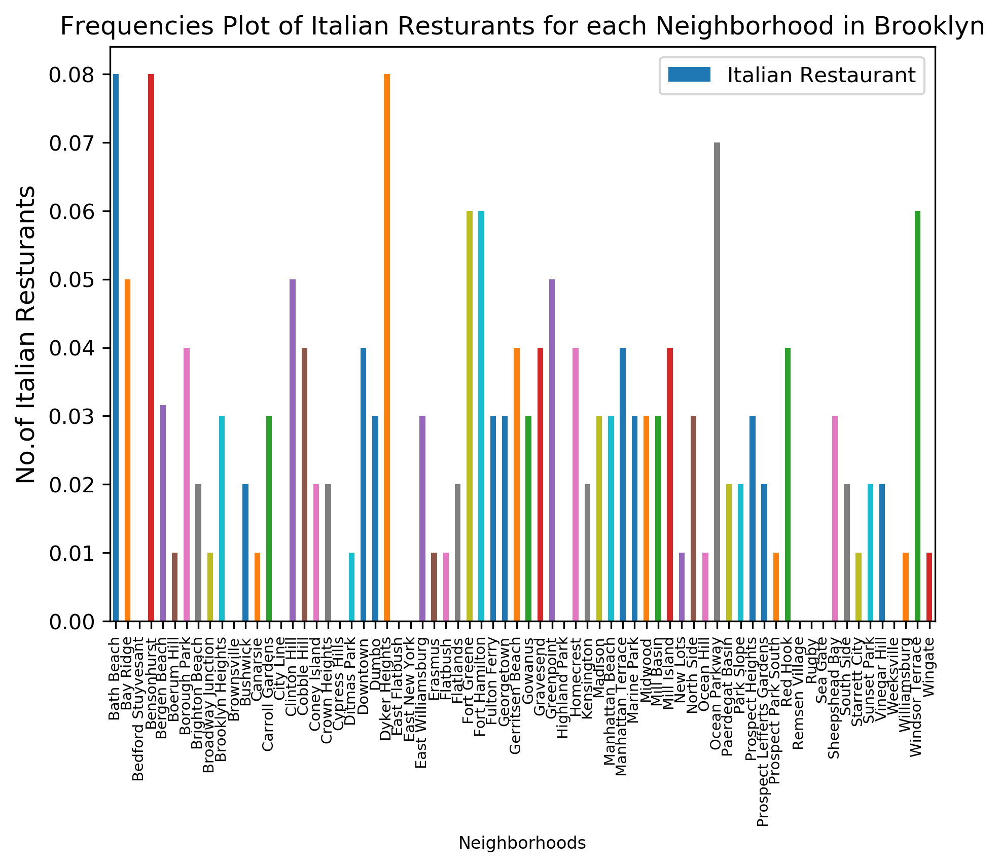

In [418]:
plt.figure(figsize=(7,5), dpi = 300)
# title
plt.title('Frequencies Plot of Italian Resturants for each Neighborhood in Brooklyn')
#On x-axis
plt.xlabel('Neighborhoods', fontsize = 8)
#x-axis label angled
plt.xticks(rotation=90, fontweight='light',fontsize='x-small') 
#On y-axis
plt.ylabel('No.of Italian Resturants', fontsize=12)
#giving a bar plot
italian_restaurant_plot.groupby('Neighborhoods')['Italian Restaurant'].nlargest(70).plot(kind='bar')
#legend
plt.legend()
#displays the plot
plt.show()

In [419]:
se_onehot.loc[se_onehot['Italian Restaurant'] != 0]

,Neighborhoods,Accessories Store,African Restaurant,American Restaurant,Animal Shelter,Antique Shop,Aquarium,Arcade,Arepa Restaurant,Argentinian Restaurant,Art Gallery,Art Museum,Arts & Crafts Store,Asian Restaurant,Athletics & Sports,Austrian Restaurant,BBQ Joint,Bagel Shop,Bakery,Bank,Bar,Baseball Field,Baseball Stadium,Basketball Stadium,Bath House,Bay,Beach,Bed & Breakfast,Beer Bar,Beer Garden,Beer Store,Big Box Store,Bike Shop,Bistro,Board Shop,Boat or Ferry,Bookstore,Botanical Garden,Boutique,Bowling Alley,Boxing Gym,Breakfast Spot,Brewery,Bridge,Bubble Tea Shop,Building,Burger Joint,Burmese Restaurant,Burrito Place,Butcher,Café,Cajun / Creole Restaurant,Candy Store,Cantonese Restaurant,Caribbean Restaurant,Caucasian Restaurant,Cemetery,Cheese Shop,Chinese Restaurant,Chocolate Shop,Climbing Gym,Clothing Store,Cocktail Bar,Coffee Shop,Colombian Restaurant,Comfort Food Restaurant,Comic Shop,Concert Hall,Convenience Store,Cosmetics Shop,Creperie,Cuban Restaurant,Cupcake Shop,Cycle Studio,Dance Studio,Deli / Bodega,Department Store,Design Studio,Dessert Shop,Diner,Discount Store,Distillery,Dive Bar,Doctor's Office,Dog Run,Donut Shop,Dumpling Restaurant,Eastern European Restaurant,Electronics Store,Empanada Restaurant,Ethiopian Restaurant,Event Space,Exhibit,Factory,Falafel Restaurant,Farm,Farmers Market,Fast Food Restaurant,Field,Filipino Restaurant,Film Studio,Fish & Chips Shop,Fish Market,Flower Shop,Food,Food & Drink Shop,Food Court,Food Truck,French Restaurant,Fried Chicken Joint,Frozen Yogurt Shop,Fruit & Vegetable Store,Furniture / Home Store,Gaming Cafe,Garden,Garden Center,Gas Station,Gastropub,Gay Bar,German Restaurant,Gift Shop,Go Kart Track,Golf Course,Gourmet Shop,Greek Restaurant,Grocery Store,Gym,Gym / Fitness Center,Gymnastics Gym,Halal Restaurant,Harbor / Marina,Hardware Store,Health & Beauty Service,Health Food Store,Heliport,Herbs & Spices Store,High School,Historic Site,History Museum,Hookah Bar,Hot Dog Joint,Hotel,Hotel Bar,Hotpot Restaurant,Ice Cream Shop,Indian Restaurant,Indie Movie Theater,Indie Theater,Indonesian Restaurant,Indoor Play Area,Irish Pub,Island,Israeli Restaurant,Italian Restaurant,Japanese Restaurant,Jazz Club,Jewelry Store,Jewish Restaurant,Juice Bar,Kebab Restaurant,Kids Store,Kofte Place,Korean Restaurant,Lake,Latin American Restaurant,Laundry Service,Lebanese Restaurant,Library,Lingerie Store,Liquor Store,Lounge,Malay Restaurant,Market,Martial Arts Dojo,Massage Studio,Mediterranean Restaurant,Men's Store,Mexican Restaurant,Middle Eastern Restaurant,Miscellaneous Shop,Mobile Phone Shop,Monument / Landmark,Moroccan Restaurant,Motorcycle Shop,Movie Theater,Moving Target,Museum,Music Store,Music Venue,Nail Salon,Neighborhood,New American Restaurant,Nightclub,Non-Profit,Noodle House,Opera House,Optical Shop,Organic Grocery,Other Great Outdoors,Other Repair Shop,Outdoors & Recreation,Pakistani Restaurant,Paper / Office Supplies Store,Park,Pedestrian Plaza,Performing Arts Venue,Persian Restaurant,Peruvian Restaurant,Pet Store,Pharmacy,Pie Shop,Pier,Pilates Studio,Pizza Place,Playground,Plaza,Polish Restaurant,Pool,Pool Hall,Pub,Ramen Restaurant,Record Shop,Rental Car Location,Residential Building (Apartment / Condo),Restaurant,Rock Club,Russian Restaurant,Salad Place,Salon / Barbershop,Sandwich Place,Scandinavian Restaurant,Scenic Lookout,School,Sculpture Garden,Seafood Restaurant,Shanghai Restaurant,Shipping Store,Shoe Store,Shopping Mall,Shopping Plaza,Skate Park,Skating Rink,Smoke Shop,Snack Place,Soccer Field,Soup Place,South American Restaurant,Southern / Soul Food Restaurant,Souvenir Shop,Spa,Spanish Restaurant,Speakeasy,Sporting Goods Shop,Sports Bar,Sports Club,Stables,State / Provincial Park,Steakhouse,Storage Facility,Street Art,Street Food Gathering,Supermarket,Supplement Shop,Surf Spot,Sushi Restaurant,Szechuan Restaurant,Taco Place,Taiwanese Restaurant,Tanning Salon,Tapas Restaurant,Tattoo Parlor,Tea Room,Tennis Court,Thai Restaurant,Theater,Theme Park,Theme Park Ride / Attrac

In [420]:
se_onehot.loc[se_onehot['Neighborhoods'] == 'Dumbo']

,Neighborhoods,Accessories Store,African Restaurant,American Restaurant,Animal Shelter,Antique Shop,Aquarium,Arcade,Arepa Restaurant,Argentinian Restaurant,Art Gallery,Art Museum,Arts & Crafts Store,Asian Restaurant,Athletics & Sports,Austrian Restaurant,BBQ Joint,Bagel Shop,Bakery,Bank,Bar,Baseball Field,Baseball Stadium,Basketball Stadium,Bath House,Bay,Beach,Bed & Breakfast,Beer Bar,Beer Garden,Beer Store,Big Box Store,Bike Shop,Bistro,Board Shop,Boat or Ferry,Bookstore,Botanical Garden,Boutique,Bowling Alley,Boxing Gym,Breakfast Spot,Brewery,Bridge,Bubble Tea Shop,Building,Burger Joint,Burmese Restaurant,Burrito Place,Butcher,Café,Cajun / Creole Restaurant,Candy Store,Cantonese Restaurant,Caribbean Restaurant,Caucasian Restaurant,Cemetery,Cheese Shop,Chinese Restaurant,Chocolate Shop,Climbing Gym,Clothing Store,Cocktail Bar,Coffee Shop,Colombian Restaurant,Comfort Food Restaurant,Comic Shop,Concert Hall,Convenience Store,Cosmetics Shop,Creperie,Cuban Restaurant,Cupcake Shop,Cycle Studio,Dance Studio,Deli / Bodega,Department Store,Design Studio,Dessert Shop,Diner,Discount Store,Distillery,Dive Bar,Doctor's Office,Dog Run,Donut Shop,Dumpling Restaurant,Eastern European Restaurant,Electronics Store,Empanada Restaurant,Ethiopian Restaurant,Event Space,Exhibit,Factory,Falafel Restaurant,Farm,Farmers Market,Fast Food Restaurant,Field,Filipino Restaurant,Film Studio,Fish & Chips Shop,Fish Market,Flower Shop,Food,Food & Drink Shop,Food Court,Food Truck,French Restaurant,Fried Chicken Joint,Frozen Yogurt Shop,Fruit & Vegetable Store,Furniture / Home Store,Gaming Cafe,Garden,Garden Center,Gas Station,Gastropub,Gay Bar,German Restaurant,Gift Shop,Go Kart Track,Golf Course,Gourmet Shop,Greek Restaurant,Grocery Store,Gym,Gym / Fitness Center,Gymnastics Gym,Halal Restaurant,Harbor / Marina,Hardware Store,Health & Beauty Service,Health Food Store,Heliport,Herbs & Spices Store,High School,Historic Site,History Museum,Hookah Bar,Hot Dog Joint,Hotel,Hotel Bar,Hotpot Restaurant,Ice Cream Shop,Indian Restaurant,Indie Movie Theater,Indie Theater,Indonesian Restaurant,Indoor Play Area,Irish Pub,Island,Israeli Restaurant,Italian Restaurant,Japanese Restaurant,Jazz Club,Jewelry Store,Jewish Restaurant,Juice Bar,Kebab Restaurant,Kids Store,Kofte Place,Korean Restaurant,Lake,Latin American Restaurant,Laundry Service,Lebanese Restaurant,Library,Lingerie Store,Liquor Store,Lounge,Malay Restaurant,Market,Martial Arts Dojo,Massage Studio,Mediterranean Restaurant,Men's Store,Mexican Restaurant,Middle Eastern Restaurant,Miscellaneous Shop,Mobile Phone Shop,Monument / Landmark,Moroccan Restaurant,Motorcycle Shop,Movie Theater,Moving Target,Museum,Music Store,Music Venue,Nail Salon,Neighborhood,New American Restaurant,Nightclub,Non-Profit,Noodle House,Opera House,Optical Shop,Organic Grocery,Other Great Outdoors,Other Repair Shop,Outdoors & Recreation,Pakistani Restaurant,Paper / Office Supplies Store,Park,Pedestrian Plaza,Performing Arts Venue,Persian Restaurant,Peruvian Restaurant,Pet Store,Pharmacy,Pie Shop,Pier,Pilates Studio,Pizza Place,Playground,Plaza,Polish Restaurant,Pool,Pool Hall,Pub,Ramen Restaurant,Record Shop,Rental Car Location,Residential Building (Apartment / Condo),Restaurant,Rock Club,Russian Restaurant,Salad Place,Salon / Barbershop,Sandwich Place,Scandinavian Restaurant,Scenic Lookout,School,Sculpture Garden,Seafood Restaurant,Shanghai Restaurant,Shipping Store,Shoe Store,Shopping Mall,Shopping Plaza,Skate Park,Skating Rink,Smoke Shop,Snack Place,Soccer Field,Soup Place,South American Restaurant,Southern / Soul Food Restaurant,Souvenir Shop,Spa,Spanish Restaurant,Speakeasy,Sporting Goods Shop,Sports Bar,Sports Club,Stables,State / Provincial Park,Steakhouse,Storage Facility,Street Art,Street Food Gathering,Supermarket,Supplement Shop,Surf Spot,Sushi Restaurant,Szechuan Restaurant,Taco Place,Taiwanese Restaurant,Tanning Salon,Tapas Restaurant,Tattoo Parlor,Tea Room,Tennis Court,Thai Restaurant,Theater,Theme Park,Theme Park Ride / Attrac

In [421]:
se_onehot.to_csv('sebroo_onehot.csv', index = False)

In [422]:
se_onehot.shape

(6940, 302)

The new dataframe size is given above

### 3.5.3 Regrouping and Category Statistics

In [431]:
se_grouped = se_onehot.groupby('Neighborhoods').mean().reset_index()
se_grouped.head()

,Neighborhoods,Accessories Store,African Restaurant,American Restaurant,Animal Shelter,Antique Shop,Aquarium,Arcade,Arepa Restaurant,Argentinian Restaurant,Art Gallery,Art Museum,Arts & Crafts Store,Asian Restaurant,Athletics & Sports,Austrian Restaurant,BBQ Joint,Bagel Shop,Bakery,Bank,Bar,Baseball Field,Baseball Stadium,Basketball Stadium,Bath House,Bay,Beach,Bed & Breakfast,Beer Bar,Beer Garden,Beer Store,Big Box Store,Bike Shop,Bistro,Board Shop,Boat or Ferry,Bookstore,Botanical Garden,Boutique,Bowling Alley,Boxing Gym,Breakfast Spot,Brewery,Bridge,Bubble Tea Shop,Building,Burger Joint,Burmese Restaurant,Burrito Place,Butcher,Café,Cajun / Creole Restaurant,Candy Store,Cantonese Restaurant,Caribbean Restaurant,Caucasian Restaurant,Cemetery,Cheese Shop,Chinese Restaurant,Chocolate Shop,Climbing Gym,Clothing Store,Cocktail Bar,Coffee Shop,Colombian Restaurant,Comfort Food Restaurant,Comic Shop,Concert Hall,Convenience Store,Cosmetics Shop,Creperie,Cuban Restaurant,Cupcake Shop,Cycle Studio,Dance Studio,Deli / Bodega,Department Store,Design Studio,Dessert Shop,Diner,Discount Store,Distillery,Dive Bar,Doctor's Office,Dog Run,Donut Shop,Dumpling Restaurant,Eastern European Restaurant,Electronics Store,Empanada Restaurant,Ethiopian Restaurant,Event Space,Exhibit,Factory,Falafel Restaurant,Farm,Farmers Market,Fast Food Restaurant,Field,Filipino Restaurant,Film Studio,Fish & Chips Shop,Fish Market,Flower Shop,Food,Food & Drink Shop,Food Court,Food Truck,French Restaurant,Fried Chicken Joint,Frozen Yogurt Shop,Fruit & Vegetable Store,Furniture / Home Store,Gaming Cafe,Garden,Garden Center,Gas Station,Gastropub,Gay Bar,German Restaurant,Gift Shop,Go Kart Track,Golf Course,Gourmet Shop,Greek Restaurant,Grocery Store,Gym,Gym / Fitness Center,Gymnastics Gym,Halal Restaurant,Harbor / Marina,Hardware Store,Health & Beauty Service,Health Food Store,Heliport,Herbs & Spices Store,High School,Historic Site,History Museum,Hookah Bar,Hot Dog Joint,Hotel,Hotel Bar,Hotpot Restaurant,Ice Cream Shop,Indian Restaurant,Indie Movie Theater,Indie Theater,Indonesian Restaurant,Indoor Play Area,Irish Pub,Island,Israeli Restaurant,Italian Restaurant,Japanese Restaurant,Jazz Club,Jewelry Store,Jewish Restaurant,Juice Bar,Kebab Restaurant,Kids Store,Kofte Place,Korean Restaurant,Lake,Latin American Restaurant,Laundry Service,Lebanese Restaurant,Library,Lingerie Store,Liquor Store,Lounge,Malay Restaurant,Market,Martial Arts Dojo,Massage Studio,Mediterranean Restaurant,Men's Store,Mexican Restaurant,Middle Eastern Restaurant,Miscellaneous Shop,Mobile Phone Shop,Monument / Landmark,Moroccan Restaurant,Motorcycle Shop,Movie Theater,Moving Target,Museum,Music Store,Music Venue,Nail Salon,Neighborhood,New American Restaurant,Nightclub,Non-Profit,Noodle House,Opera House,Optical Shop,Organic Grocery,Other Great Outdoors,Other Repair Shop,Outdoors & Recreation,Pakistani Restaurant,Paper / Office Supplies Store,Park,Pedestrian Plaza,Performing Arts Venue,Persian Restaurant,Peruvian Restaurant,Pet Store,Pharmacy,Pie Shop,Pier,Pilates Studio,Pizza Place,Playground,Plaza,Polish Restaurant,Pool,Pool Hall,Pub,Ramen Restaurant,Record Shop,Rental Car Location,Residential Building (Apartment / Condo),Restaurant,Rock Club,Russian Restaurant,Salad Place,Salon / Barbershop,Sandwich Place,Scandinavian Restaurant,Scenic Lookout,School,Sculpture Garden,Seafood Restaurant,Shanghai Restaurant,Shipping Store,Shoe Store,Shopping Mall,Shopping Plaza,Skate Park,Skating Rink,Smoke Shop,Snack Place,Soccer Field,Soup Place,South American Restaurant,Southern / Soul Food Restaurant,Souvenir Shop,Spa,Spanish Restaurant,Speakeasy,Sporting Goods Shop,Sports Bar,Sports Club,Stables,State / Provincial Park,Steakhouse,Storage Facility,Street Art,Street Food Gathering,Supermarket,Supplement Shop,Surf Spot,Sushi Restaurant,Szechuan Restaurant,Taco Place,Taiwanese Restaurant,Tanning Salon,Tapas Restaurant,Tattoo Parlor,Tea Room,Tennis Court,Thai Restaurant,Theater,Theme Park,Theme Park Ride / Attrac

In [425]:
print("Before One-hot encoding:", df_broo.shape)
print("After One-hot encoding:", se_grouped.shape)

Before One-hot encoding: (70, 4)
After One-hot encoding: (70, 302)


In [426]:
se_grouped.to_csv('brooklyn_grouped.csv', index = False)

Grouping of each Neighbourhoods with 10 common venues:

In [427]:
num_top_venues = 10 # Top common venues needed

for hood in se_grouped['Neighborhoods']:
    print("----"+hood+"----")
    temp = se_grouped[se_grouped['Neighborhoods'] == hood].T.reset_index()
    temp.columns = ['venue', 'freq']
    temp = temp.iloc[1:]
    temp['freq'] = temp['freq'].astype(float)
    temp = temp.round({'freq': 2})
    print(temp.sort_values('freq', ascending = False).reset_index(drop = True).head(num_top_venues))
    print('\n')

----Bath Beach----
                venue  freq
0         Pizza Place  0.09
1  Italian Restaurant  0.08
2              Bakery  0.07
3    Sushi Restaurant  0.04
4          Bagel Shop  0.04
5            Pharmacy  0.03
6                Park  0.03
7      Ice Cream Shop  0.03
8         Supermarket  0.03
9      Sandwich Place  0.03


----Bay Ridge----
                 venue  freq
0          Pizza Place  0.07
1                  Spa  0.06
2   Italian Restaurant  0.05
3     Greek Restaurant  0.05
4                  Bar  0.04
5          Coffee Shop  0.04
6               Bakery  0.03
7           Bagel Shop  0.03
8        Grocery Store  0.03
9  American Restaurant  0.03


----Bedford Stuyvesant----
                     venue  freq
0                      Bar  0.14
1              Coffee Shop  0.13
2              Pizza Place  0.06
3                     Café  0.04
4     Caribbean Restaurant  0.04
5  New American Restaurant  0.04
6               Taco Place  0.03
7                Wine Shop  0.03
8       

                       venue  freq
0                Pizza Place  0.09
1         Italian Restaurant  0.08
2                        Spa  0.06
3                     Bakery  0.05
4                        Bar  0.04
5       Gym / Fitness Center  0.03
6             Cosmetics Shop  0.03
7  Middle Eastern Restaurant  0.02
8        Japanese Restaurant  0.02
9                      Diner  0.02


----East Flatbush----
                    venue  freq
0    Caribbean Restaurant  0.25
1              Donut Shop  0.05
2       Convenience Store  0.03
3           Deli / Bodega  0.03
4               Juice Bar  0.03
5          Discount Store  0.03
6    Gym / Fitness Center  0.03
7  Furniture / Home Store  0.02
8        Video Game Store  0.02
9       Indian Restaurant  0.02


----East New York----
                       venue  freq
0                Pizza Place  0.12
1             Discount Store  0.09
2                Supermarket  0.07
3       Fast Food Restaurant  0.06
4                 Donut Shop  0.06
5    

                  venue  freq
0           Pizza Place  0.10
1        Discount Store  0.08
2           Supermarket  0.05
3  Fast Food Restaurant  0.05
4        Sandwich Place  0.05
5            Donut Shop  0.04
6         Grocery Store  0.03
7      Department Store  0.03
8            Shoe Store  0.03
9         Deli / Bodega  0.03


----North Side----
                 venue  freq
0          Pizza Place  0.06
1          Coffee Shop  0.05
2          Yoga Studio  0.05
3       Ice Cream Shop  0.03
4                 Café  0.03
5         Cocktail Bar  0.03
6   Italian Restaurant  0.03
7             Wine Bar  0.03
8  American Restaurant  0.03
9            Bookstore  0.02


----Ocean Hill----
                             venue  freq
0                      Pizza Place  0.07
1                           Bakery  0.07
2                             Café  0.07
3                      Coffee Shop  0.06
4                    Deli / Bodega  0.05
5                             Park  0.05
6                     

Creating new dataframe:
Putting the common venues into pandas dataframe, the following return_most_common_venuesis used to sort the venues in descending order.

In [428]:
def return_most_common_venues(row, num_top_venues):
    row_categories = row.iloc[1:]
    row_categories_sorted = row_categories.sort_values(ascending = False)
    
    return row_categories_sorted.index.values[0:num_top_venues]

Create a new panda dataframe with 10 most common venues: 

In [432]:
num_top_venues = 10

indicators = ['st', 'nd', 'rd']

# create columns according to number of top venues
columns = ['Neighborhood']
for ind in np.arange(num_top_venues):
    try:
        columns.append('{}{} Most Common Venue'.format(ind+1, indicators[ind]))
    except:
        columns.append('{}th Most Common Venue'.format(ind+1))

# create a new dataframe
neighborhoods_venues_sorted = pd.DataFrame(columns=columns)
neighborhoods_venues_sorted['Neighborhood'] = se_grouped['Neighborhoods']

for ind in np.arange(se_grouped.shape[0]):
    neighborhoods_venues_sorted.iloc[ind, 1:] = return_most_common_venues(se_grouped.iloc[ind, :], num_top_venues)


In [433]:
neighborhoods_venues_sorted.head()

,Neighborhood,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
0,Bath Beach,Pizza Place,Italian Restaurant,Bakery,Bagel Shop,Sushi Restaurant,Park,Pharmacy,Ice Cream Shop,Sandwich Place,Supermarket
1,Bay Ridge,Pizza Place,Spa,Italian Restaurant,Greek Restaurant,Bar,Coffee Shop,American Restaurant,Bakery,Bagel Shop,Grocery Store
2,Bedford Stuyvesant,Bar,Coffee Shop,Pizza Place,New American Restaurant,Café,Caribbean Restaurant,Wine Shop,Taco Place,Cocktail Bar,French Restaurant
3,Bensonhurst,Pizza Place,Bakery,Italian Restaurant,Sushi Restaurant,Coffee Shop,Bagel Shop,Chinese Restaurant,Ice Cream Shop,Supermarket,Sandwich Place
4,Bergen Beach,Clothing Store,Pizza Place,Donut Shop,Cosmetics Shop,Harbor / Marina,Bank,Italian Restaurant,Shoe Store,Pharmacy,Deli / Bodega


In [434]:
neighborhoods_venues_sorted.to_csv('neighborhoods_venues_sorted.csv', index = False)

In [447]:
se_grouped_clustering = se_grouped.drop('Neighborhoods', 1)

## 3.6 Clustering of Neighborhoods
The next thing to do now, is to create clusters of the neighbourhood using the k-means to cluster the neighbourhood into 6 clusters.

In [480]:
# set number of clusters
kclusters = 6

# run k-means clustering
kmeans = KMeans(n_clusters = kclusters, random_state=0).fit(se_grouped_clustering)

# check cluster labels generated for each row in the dataframe
kmeans.labels_[0:10]

array([1, 1, 0, 1, 1, 2, 1, 4, 5, 2], dtype=int32)

In [449]:
kmeans.labels_[0:10]

array([3, 0, 1, 3, 0, 5, 0, 0, 4, 5], dtype=int32)

Now creating a new dataframe that includes the clusters as well as the top 10 venues for each neighbourhoods.

In [451]:
# add clustering labels
neighborhoods_venues_sorted.insert(0, 'Cluster Labels', kmeans.labels_)

ValueError: cannot insert Cluster Labels, already exists

In [452]:
se_merged = df_broo

In [453]:
se_merged.head(3)

,Borough,Neighborhood,Latitude,Longitude
46,Brooklyn,Bay Ridge,40.625801,-74.030621
47,Brooklyn,Bensonhurst,40.611009,-73.995180
48,Brooklyn,Sunset Park,40.645103,-74.010316


In [454]:
# match/merge SE NY data with latitude/longitude for each neighborhood
se_merged_latlong = se_merged.join(neighborhoods_venues_sorted.set_index('Neighborhood'), on = 'Neighborhood')

In [455]:
se_clusters = se_merged_latlong

#### Note that the number of clusters was chosen as 6 for initial run.

### 3.6.1 Optimal Number of Clusters for K-mean
To get the optimal number of clusters to be used for the K-mean, there are a number ways possible for the evaluation. Therefore, in this task, the following are used:
 - Eblow Criterion Method
 - Silhouette Coefficient

#### 1. Elbow Method

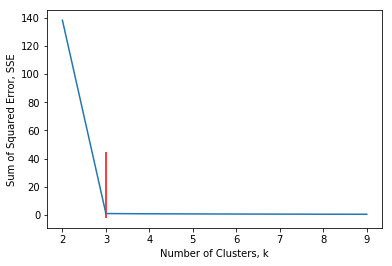

In [461]:
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt

# SSE is initialize with empty values
# n_clusters is the "k" 
sse = {}
for n_cluster1 in range(2, 10):
    kmeans1 = KMeans(n_clusters = n_cluster1, max_iter = 1000).fit(se_grouped_clustering)
    se_grouped_clustering["clusters"] = kmeans1.labels_
    
    # The inertia is the sum of distances of samples to their closest cluster centre
    sse[n_cluster1] = kmeans1.inertia_ 
plt.figure()
plt.plot(list(sse.keys()), list(sse.values()))
plt.xlabel("Number of Clusters, k")
plt.ylabel("Sum of Squared Error, SSE")
# vertical line
plt.vlines(3, ymin = -2, ymax = 45, colors = 'red')
plt.show()

Depending on the number of iteration (in this case, 1000 iterations were used), the number of cluster, k is 3

#### 2. Silhouette Coefficient

In [462]:
from sklearn.metrics import silhouette_score
from sklearn.cluster import KMeans

for n_cluster2 in range(2, 10):
    kmeans2 = KMeans(n_clusters = n_cluster2, random_state = 0).fit(se_grouped_clustering)
    label2 = kmeans2.labels_
    sil_coeff = silhouette_score(se_grouped_clustering, label2, metric = 'euclidean')
    print("Where n_clusters = {}, the Silhouette Coefficient is {}".format(n_cluster2, sil_coeff))

Where n_clusters = 2, the Silhouette Coefficient is 0.6851217257387712
Where n_clusters = 3, the Silhouette Coefficient is 0.5892926681399638
Where n_clusters = 4, the Silhouette Coefficient is 0.6616763025206316
Where n_clusters = 5, the Silhouette Coefficient is 0.702503816533258
Where n_clusters = 6, the Silhouette Coefficient is 0.7628626671863556
Where n_clusters = 7, the Silhouette Coefficient is 0.7642815305016414
Where n_clusters = 8, the Silhouette Coefficient is 0.8315147670865546
Where n_clusters = 9, the Silhouette Coefficient is 0.8674336936951222


From the result, the high the n_clusters the better the silhouette coefficient. For this project, a cluster value of 6 will be used.

In [307]:
se_clusters.columns

Index(['Borough', 'Neighborhood', 'Latitude', 'Longitude', 'Cluster Labels',
       '1st Most Common Venue', '2nd Most Common Venue',
       '3rd Most Common Venue', '4th Most Common Venue',
       '5th Most Common Venue', '6th Most Common Venue',
       '7th Most Common Venue', '8th Most Common Venue',
       '9th Most Common Venue', '10th Most Common Venue'],
      dtype='object')

### 3.6.2 Visualizing the Resulting Clusters

In [497]:
# create map
map_clusters = folium.Map(location=[latitude, longitude], tiles="stamenterrain", zoom_start=11)

# set color scheme for the clusters
x = np.arange(kclusters)
ys = [i + x + (i*x)**2 for i in range(kclusters)]
colors_array = cm.rainbow(np.linspace(0, 1, len(ys)))
rainbow = [colors.rgb2hex(i) for i in colors_array]

# add markers to the map
markers_colors = []
for lat, lon, poi, cluster in zip(se_clusters['Latitude'], se_clusters['Longitude'], se_clusters['Neighborhood'], se_clusters['Cluster Labels']):
    label = folium.Popup(str(poi) + ' Cluster ' + str(cluster), parse_html=True)
    folium.CircleMarker(
        [lat, lon],
        radius=10,
        popup=label,
        color=rainbow[cluster-1],
        fill=True,
        fill_color=rainbow[cluster-1],
        fill_opacity=0.7).add_to(map_clusters)

display(map_clusters)

### Cluster 0

In [476]:
se_clusters.loc[se_clusters['Cluster Labels'] == 0, se_clusters.columns[[1] + list(range(5, se_clusters.shape[1]))]]

,Neighborhood,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
46,Bay Ridge,Pizza Place,Spa,Italian Restaurant,Greek Restaurant,Bar,Coffee Shop,American Restaurant,Bakery,Bagel Shop,Grocery Store
51,Brighton Beach,Theme Park Ride / Attraction,Pizza Place,Beach,Restaurant,Grocery Store,Eastern European Restaurant,Theme Park,Ice Cream Shop,Café,Food Truck
76,Mill Island,Clothing Store,Pharmacy,Donut Shop,Italian Restaurant,Pizza Place,Ice Cream Shop,Bagel Shop,Shoe Store,Bank,Mobile Phone Shop
78,Coney Island,Theme Park,Theme Park Ride / Attraction,Beach,Hot Dog Joint,Park,Aquarium,Pizza Place,Mobile Phone Shop,Food Truck,Mexican Restaurant
80,Borough Park,Pizza Place,Café,Bakery,Chinese Restaurant,Italian Restaurant,Grocery Store,Vietnamese Restaurant,Mexican Restaurant,Thai Restaurant,Park
81,Dyker Heights,Pizza Place,Italian Restaurant,Spa,Bakery,Bar,Cosmetics Shop,Gym / Fitness Center,Breakfast Spot,Coffee Shop,Middle Eastern Restaurant
85,Sea Gate,Beach,Park,Harbor / Marina,Supermarket,Baseball Stadium,Pizza Place,Gas Station,Outdoors & Recreation,Music Venue,Bay
91,Bergen Beach,Clothing Store,Pizza Place,Donut Shop,Cosmetics Shop,Harbor / Marina,Bank,Italian Restaurant,Shoe Store,Pharmacy,Deli / Bodega
99,Fort Hamilton,Pizza Place,Italian Restaurant,Spa,Bakery,Gym / Fitness Center,Japanese Restaurant,Department Store,Greek Restaurant,Bar,Cosmetics Shop
262,Mill Basin,Pizza Place,Donut Shop,Clothing Store,Pharmacy,Supermarket,Caribbean Restaurant,Coffee Shop,Convenience Store,Bank,Bagel Shop


### Top 5 most common venues in cluster 0

In [477]:
neighborhoods_clustered_0 = pd.DataFrame(se_clusters.loc[se_clusters['Cluster Labels'] == 0, se_clusters.columns[[1] + list(range(5, se_clusters.shape[1]))]])

def mode(x):
    return x.mode()[0]
def freq(x):
    return '{0:.2f}%'.format(100 * x.value_counts()[0] / x.count())

neighborhoods_clustered_0.agg({'Neighborhood': 'count', 
                                                                   '1st Most Common Venue': [mode, freq],
                                                                    '2nd Most Common Venue': [mode, freq],
                                                                    '3rd Most Common Venue': [mode, freq],
                                                                    '4th Most Common Venue': [mode, freq],
                                                                    '5th Most Common Venue': [mode, freq]
                                                                   })

,Neighborhood,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue
count,10.0,NaN,NaN,NaN,NaN,NaN
freq,NaN,50.00%,20.00%,20.00%,20.00%,20.00%
mode,NaN,Pizza Place,Italian Restaurant,Beach,Bakery,Bar


### Cluster 1

In [478]:
se_clusters.loc[se_clusters['Cluster Labels'] == 1, se_clusters.columns[[1] + list(range(5, se_clusters.shape[1]))]]

,Neighborhood,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
48,Sunset Park,Bakery,Pizza Place,Mexican Restaurant,Café,Chinese Restaurant,Latin American Restaurant,Brewery,Park,Coffee Shop,Asian Restaurant
54,Flatbush,Caribbean Restaurant,Coffee Shop,Thai Restaurant,Pizza Place,Mexican Restaurant,Bar,Bakery,Bagel Shop,Café,Deli / Bodega
55,Crown Heights,Caribbean Restaurant,Café,Cocktail Bar,Bar,Coffee Shop,Bakery,Wine Shop,Pizza Place,Juice Bar,Beer Bar
57,Kensington,Café,Pizza Place,Thai Restaurant,Coffee Shop,Grocery Store,Bar,Mexican Restaurant,American Restaurant,Wine Shop,Italian Restaurant
63,Bedford Stuyvesant,Bar,Coffee Shop,Pizza Place,New American Restaurant,Café,Caribbean Restaurant,Wine Shop,Taco Place,Cocktail Bar,French Restaurant
89,Ocean Hill,Pizza Place,Café,Bakery,Coffee Shop,Park,Deli / Bodega,Bar,Caribbean Restaurant,Restaurant,Gym
92,Midwood,Pizza Place,Caribbean Restaurant,Coffee Shop,Convenience Store,Ice Cream Shop,Restaurant,Italian Restaurant,Bar,Bakery,Bagel Shop
93,Prospect Park South,Caribbean Restaurant,Bar,Café,Wine Shop,Coffee Shop,Grocery Store,Indian Restaurant,Park,Thai Restaurant,Pizza Place
221,Ditmas Park,Caribbean Restaurant,Pizza Place,Bar,Coffee Shop,Café,Wine Shop,Mexican Restaurant,Thai Restaurant,Park,Grocery Store
281,Weeksville,Coffee Shop,Caribbean Restaurant,Café,Bakery,Bar,Park,Mexican Restaurant,Gym,Pizza Place,Wine Shop


### Top 5 most common venues in cluster 1

In [479]:
neighborhoods_clustered_1 = pd.DataFrame(se_clusters.loc[se_clusters['Cluster Labels'] == 1, se_clusters.columns[[1] + list(range(5, se_clusters.shape[1]))]])

def mode(x):
    return x.mode()[0]
def freq(x):
    return '{0:.2f}%'.format(100 * x.value_counts()[0] / x.count())

neighborhoods_clustered_1.agg({'Neighborhood': 'count', 
                                                                   '1st Most Common Venue': [mode, freq],
                                                                    '2nd Most Common Venue': [mode, freq],
                                                                    '3rd Most Common Venue': [mode, freq],
                                                                    '4th Most Common Venue': [mode, freq],
                                                                    '5th Most Common Venue': [mode, freq]
                                                                   })

,Neighborhood,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue
count,10.0,NaN,NaN,NaN,NaN,NaN
freq,NaN,40.00%,30.00%,20.00%,30.00%,20.00%
mode,NaN,Caribbean Restaurant,Pizza Place,Café,Coffee Shop,Café


### Cluster 2

In [468]:
se_clusters.loc[se_clusters['Cluster Labels'] == 2, se_clusters.columns[[1] + list(range(5, se_clusters.shape[1]))]]

,Neighborhood,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
56,East Flatbush,Caribbean Restaurant,Donut Shop,Gym / Fitness Center,Convenience Store,Juice Bar,Discount Store,Deli / Bodega,Mobile Phone Shop,Performing Arts Venue,Fast Food Restaurant
75,Flatlands,Caribbean Restaurant,Pizza Place,Donut Shop,Mobile Phone Shop,Convenience Store,Pharmacy,Ice Cream Shop,Bakery,Coffee Shop,Performing Arts Venue
88,Prospect Lefferts Gardens,Caribbean Restaurant,Café,Garden,Pizza Place,Cocktail Bar,Bakery,Park,Wine Shop,Grocery Store,Liquor Store
222,Wingate,Caribbean Restaurant,Café,Bakery,Pizza Place,Juice Bar,Cocktail Bar,Coffee Shop,Chinese Restaurant,Gym,Gym / Fitness Center
223,Rugby,Caribbean Restaurant,Discount Store,Donut Shop,Pizza Place,Mobile Phone Shop,Seafood Restaurant,Sandwich Place,Bakery,Fast Food Restaurant,Chinese Restaurant
259,Remsen Village,Caribbean Restaurant,Discount Store,Pizza Place,Pharmacy,Donut Shop,Gym / Fitness Center,Seafood Restaurant,Bank,Sandwich Place,Supermarket
300,Erasmus,Caribbean Restaurant,Bakery,Café,Juice Bar,Grocery Store,Pizza Place,Cocktail Bar,Gym / Fitness Center,Bar,Furniture / Home Store


### Top 5 most common venues in cluster 2

In [469]:
neighborhoods_clustered_2 = pd.DataFrame(se_clusters.loc[se_clusters['Cluster Labels'] == 2, se_clusters.columns[[1] + list(range(5, se_clusters.shape[1]))]])

def mode(x):
    return x.mode()[0]
def freq(x):
    return '{0:.2f}%'.format(100 * x.value_counts()[0] / x.count())

neighborhoods_clustered_2.agg({'Neighborhood': 'count', 
                                                                   '1st Most Common Venue': [mode, freq],
                                                                    '2nd Most Common Venue': [mode, freq],
                                                                    '3rd Most Common Venue': [mode, freq],
                                                                    '4th Most Common Venue': [mode, freq],
                                                                    '5th Most Common Venue': [mode, freq]
                                                                   })

,Neighborhood,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue
count,7.0,NaN,NaN,NaN,NaN,NaN
freq,NaN,100.00%,28.57%,28.57%,42.86%,28.57%
mode,NaN,Caribbean Restaurant,Café,Donut Shop,Pizza Place,Juice Bar


### Cluster 3

In [470]:
se_clusters.loc[se_clusters['Cluster Labels'] == 3, se_clusters.columns[[1] + list(range(5, se_clusters.shape[1]))]]

,Neighborhood,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
47,Bensonhurst,Pizza Place,Bakery,Italian Restaurant,Sushi Restaurant,Coffee Shop,Bagel Shop,Chinese Restaurant,Ice Cream Shop,Supermarket,Sandwich Place
50,Gravesend,Sushi Restaurant,Bakery,Pizza Place,Bagel Shop,Grocery Store,Pharmacy,Italian Restaurant,Turkish Restaurant,Restaurant,Vietnamese Restaurant
52,Sheepshead Bay,Sushi Restaurant,Bagel Shop,Japanese Restaurant,Restaurant,Sandwich Place,Pizza Place,Grocery Store,Turkish Restaurant,Italian Restaurant,Deli / Bodega
53,Manhattan Terrace,Pizza Place,Bagel Shop,Sushi Restaurant,Bakery,Italian Restaurant,Steakhouse,Donut Shop,Grocery Store,Russian Restaurant,Deli / Bodega
77,Manhattan Beach,Sushi Restaurant,Eastern European Restaurant,Russian Restaurant,Restaurant,Turkish Restaurant,Café,Sandwich Place,Italian Restaurant,Seafood Restaurant,Pizza Place
79,Bath Beach,Pizza Place,Italian Restaurant,Bakery,Bagel Shop,Sushi Restaurant,Park,Pharmacy,Ice Cream Shop,Sandwich Place,Supermarket
82,Gerritsen Beach,Pizza Place,Sushi Restaurant,Sandwich Place,Bagel Shop,Seafood Restaurant,Bank,Italian Restaurant,Turkish Restaurant,Ice Cream Shop,Beach
83,Marine Park,Pizza Place,Bagel Shop,Donut Shop,Bakery,Sushi Restaurant,Pharmacy,Ice Cream Shop,American Restaurant,Deli / Bodega,Italian Restaurant
98,Ocean Parkway,Pizza Place,Italian Restaurant,Sushi Restaurant,Bagel Shop,Bakery,Donut Shop,Steakhouse,Supermarket,Grocery Store,Park
289,Homecrest,Sushi Restaurant,Pizza Place,Bagel Shop,Bakery,Grocery Store,Italian Restaurant,Russian Restaurant,Restaurant,Pharmacy,Japanese Restaurant


### Top 5 most common venues in cluster 3

In [471]:
neighborhoods_clustered_3 = pd.DataFrame(se_clusters.loc[se_clusters['Cluster Labels'] == 3, se_clusters.columns[[1] + list(range(5, se_clusters.shape[1]))]])

def mode(x):
    return x.mode()[0]
def freq(x):
    return '{0:.2f}%'.format(100 * x.value_counts()[0] / x.count())

neighborhoods_clustered_3.agg({'Neighborhood': 'count', 
                                                                   '1st Most Common Venue': [mode, freq],
                                                                    '2nd Most Common Venue': [mode, freq],
                                                                    '3rd Most Common Venue': [mode, freq],
                                                                    '4th Most Common Venue': [mode, freq],
                                                                    '5th Most Common Venue': [mode, freq]
                                                                   })

,Neighborhood,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue
count,11.0,NaN,NaN,NaN,NaN,NaN
freq,NaN,54.55%,27.27%,18.18%,36.36%,18.18%
mode,NaN,Pizza Place,Bagel Shop,Pizza Place,Bagel Shop,Grocery Store


### Cluster 4

In [472]:
se_clusters.loc[se_clusters['Cluster Labels'] == 4, se_clusters.columns[[1] + list(range(5, se_clusters.shape[1]))]]

,Neighborhood,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
60,Brownsville,Discount Store,Pizza Place,Caribbean Restaurant,Bakery,Gym / Fitness Center,Deli / Bodega,Supermarket,Sandwich Place,Gym,Seafood Restaurant
71,Cypress Hills,Pizza Place,Donut Shop,Supermarket,Discount Store,Fast Food Restaurant,Latin American Restaurant,Sandwich Place,Grocery Store,Ice Cream Shop,South American Restaurant
72,East New York,Pizza Place,Discount Store,Supermarket,Donut Shop,Fast Food Restaurant,Sandwich Place,Latin American Restaurant,Ice Cream Shop,Diner,Deli / Bodega
73,Starrett City,Caribbean Restaurant,Pizza Place,Discount Store,Fast Food Restaurant,Pharmacy,Ice Cream Shop,Donut Shop,Supermarket,Department Store,Shoe Store
74,Canarsie,Caribbean Restaurant,Pizza Place,Pharmacy,Bank,Sandwich Place,Discount Store,Ice Cream Shop,Donut Shop,Mobile Phone Shop,Breakfast Spot
90,City Line,Pizza Place,Donut Shop,Supermarket,Fast Food Restaurant,Discount Store,Ice Cream Shop,Sandwich Place,Fried Chicken Joint,South American Restaurant,Latin American Restaurant
94,Georgetown,Pizza Place,Donut Shop,Caribbean Restaurant,Pharmacy,Ice Cream Shop,Clothing Store,Bank,Italian Restaurant,Mobile Phone Shop,Coffee Shop
260,New Lots,Pizza Place,Discount Store,Supermarket,Fast Food Restaurant,Sandwich Place,Donut Shop,Shoe Store,Department Store,Deli / Bodega,Grocery Store
261,Paerdegat Basin,Pizza Place,Caribbean Restaurant,Pharmacy,Bank,Donut Shop,Discount Store,Mobile Phone Shop,Sandwich Place,Bagel Shop,Miscellaneous Shop
282,Broadway Junction,Pizza Place,Deli / Bodega,Sandwich Place,Discount Store,Coffee Shop,Park,Café,Southern / Soul Food Restaurant,Ice Cream Shop,Bakery


### Top 5 most common venues in cluster 4

In [473]:
neighborhoods_clustered_4 = pd.DataFrame(se_clusters.loc[se_clusters['Cluster Labels'] == 4, se_clusters.columns[[1] + list(range(5, se_clusters.shape[1]))]])

def mode(x):
    return x.mode()[0]
def freq(x):
    return '{0:.2f}%'.format(100 * x.value_counts()[0] / x.count())

neighborhoods_clustered_4.agg({'Neighborhood': 'count', 
                                                                   '1st Most Common Venue': [mode, freq],
                                                                    '2nd Most Common Venue': [mode, freq],
                                                                    '3rd Most Common Venue': [mode, freq],
                                                                    '4th Most Common Venue': [mode, freq],
                                                                    '5th Most Common Venue': [mode, freq]
                                                                   })

,Neighborhood,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue
count,11.0,NaN,NaN,NaN,NaN,NaN
freq,NaN,72.73%,27.27%,36.36%,27.27%,27.27%
mode,NaN,Pizza Place,Discount Store,Supermarket,Fast Food Restaurant,Sandwich Place


### Cluster 5

In [474]:
se_clusters.loc[se_clusters['Cluster Labels'] == 5, se_clusters.columns[[1] + list(range(5, se_clusters.shape[1]))]]

,Neighborhood,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
49,Greenpoint,Cocktail Bar,Yoga Studio,Coffee Shop,Italian Restaurant,Café,Park,Bakery,Pizza Place,Hotel,French Restaurant
58,Windsor Terrace,Bar,Italian Restaurant,Park,Wine Shop,Coffee Shop,Pizza Place,American Restaurant,Gym,Mexican Restaurant,Bakery
59,Prospect Heights,Cocktail Bar,Bar,Coffee Shop,Pizza Place,Garden,American Restaurant,Sushi Restaurant,Beer Bar,Italian Restaurant,Wine Shop
61,Williamsburg,Yoga Studio,Pizza Place,Coffee Shop,American Restaurant,Bar,Cocktail Bar,French Restaurant,Japanese Restaurant,Wine Bar,Chinese Restaurant
62,Bushwick,Bar,Pizza Place,Mexican Restaurant,Cocktail Bar,Coffee Shop,Latin American Restaurant,Yoga Studio,Grocery Store,Italian Restaurant,Café
64,Brooklyn Heights,Park,Pizza Place,Yoga Studio,Coffee Shop,Ice Cream Shop,Bakery,Gym,Men's Store,Playground,Italian Restaurant
65,Cobble Hill,Cocktail Bar,Yoga Studio,Pizza Place,Italian Restaurant,Ice Cream Shop,Coffee Shop,Bar,Seafood Restaurant,Bakery,History Museum
66,Carroll Gardens,Bar,Cocktail Bar,Pizza Place,Yoga Studio,Coffee Shop,Brewery,Italian Restaurant,Bakery,Seafood Restaurant,Ice Cream Shop
67,Red Hook,Park,Bar,Italian Restaurant,Ice Cream Shop,Seafood Restaurant,Coffee Shop,Record Shop,Pizza Place,Brewery,Wine Shop
68,Gowanus,Coffee Shop,Pizza Place,Bar,Ice Cream Shop,Brewery,Cocktail Bar,Yoga Studio,Gym,Italian Restaurant,Wine Bar


### Top 5 most common venues in cluster 5

In [475]:
neighborhoods_clustered_5 = pd.DataFrame(se_clusters.loc[se_clusters['Cluster Labels'] == 5, se_clusters.columns[[1] + list(range(5, se_clusters.shape[1]))]])

def mode(x):
    return x.mode()[0]
def freq(x):
    return '{0:.2f}%'.format(100 * x.value_counts()[0] / x.count())

neighborhoods_clustered_5.agg({'Neighborhood': 'count', 
                                                                   '1st Most Common Venue': [mode, freq],
                                                                    '2nd Most Common Venue': [mode, freq],
                                                                    '3rd Most Common Venue': [mode, freq],
                                                                    '4th Most Common Venue': [mode, freq],
                                                                    '5th Most Common Venue': [mode, freq]
                                                                   })

,Neighborhood,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue
count,21.0,NaN,NaN,NaN,NaN,NaN
freq,NaN,23.81%,28.57%,23.81%,19.05%,14.29%
mode,NaN,Bar,Pizza Place,Coffee Shop,Italian Restaurant,Cocktail Bar


# 4. Result
The following are the highlights of the 6 clusters above:
 * Pizza Place and Italian Restaurant are the most popular in the cluster 0. The Italian Restaurants are very popular in this cluster, especially in Dyker Heights, Fort Hamilton and Bay Ridge areas.
 * In clusters 1 and 2 predominant is the Caribbean Restaurant, which suggests a prevalent Caribbean presence, followed by Cafe and Pizza Place;
 * Pizza Place,	Bagel shop,	and Grocery Store are the most popular in the cluster 3.
 * Pizza Place,	Discount Store,	Supermarket, and Fast Food Restaurant are the most popular in the cluster 4.
 * Bar, Pizza Place, Coffee Shops are the most popular in the cluster 5.
 
#### *The best choice to open an Italian restaurant could be cluster 5.*
*Please note, in this cluster reside our choice Dumbo*

# 5. Discussion and Conclusion
It is very important to note that Cluster 5 is the most viable clusters to create a brand Italian Restaurant. Their proximity to other amenities are paramount. In this cluster, even if there are other Italian restaurants, the market is not saturated. So the rivalry could be minimal. 

In conclusion, this project would have had better results if there were more data in terms of crime data within the area, parking access, bus and metro stop, and allowance of more venues exploration with the Foursquare (limited venues for free calls).

Also, getting the ratings and feedbacks of the current restaurants within the clusters would have helped in providing more insight into the best location.